In [1]:
import numpy as np
import logging
import sys
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['axes.formatter.useoffset'] = False
import scipy.signal as sps
from pprint import pprint

sys.path.insert(1, '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/')
sys.path.insert(1, '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src')
import importlib
import simulation_strategies, collapse, plotting, utils, analtyic_formulas
importlib.reload(simulation_strategies)
importlib.reload(collapse)
importlib.reload(plotting)
importlib.reload(utils)
importlib.reload(analtyic_formulas)
from simulation_strategies import *
from collapse import *
from plotting import *
from utils import *
from analtyic_formulas import *
import cProfile
import pstats

from scipy.interpolate import UnivariateSpline

import warnings
warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)

import faulthandler
faulthandler.enable(all_threads=True)

In [2]:
# Default plotting settings
def my_mpl():
    plt.rc('font', family='serif', size=12)
    plt.rc('axes', grid=True)
    plt.rc('lines', lw=3)
    ts = 8
    plt.rc('xtick.minor', size=ts-2)
    plt.rc('ytick.minor', size=ts-2)
    plt.rc('xtick.major', size=ts)
    plt.rc('ytick.major', size=ts)
    plt.rc('figure', figsize=[12, 9])
my_mpl()
logging.basicConfig(level=logging.DEBUG,
                    format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [3]:
t_i = 1
G = 1
rho_H = 1/(6*np.pi*G*t_i**2)
H0 = 2/(3*t_i)

def compute_r0_min(r_min, r_max, N):
    """
    Compute r0_min such that the spacing dR in np.linspace(r0_min, r_max, N)
    satisfies dR = r0_min - r_min. That is, the inner edge of the innermost shell is at r_min.
    
    Parameters:
    - r_min (float): The minimum radius.
    - r_max (float): The maximum radius.
    - N (int): Number of points.
    
    Returns:
    - float: The computed r0_min.
    """
    return (r_max + r_min * (N - 1)) / N

def make_config(no_pm=False, **kwargs):
    # Set defaults directly in kwargs
    kwargs.setdefault('r_min', 0)
    kwargs.setdefault('r_max', 1)
    kwargs.setdefault('N', 1)
    kwargs.setdefault('H', 0)
    kwargs.setdefault('rho_bar', rho_H)
    kwargs.setdefault('delta', 0)
    kwargs.setdefault('j_coef', 0)
    kwargs.setdefault('r_min_strategy', 'nothing')
    kwargs.setdefault('t_max', 5000)
    kwargs.setdefault('dt_min', 0)
    kwargs.setdefault('stepper_strategy', 'leapfrog_kdk')
    kwargs.setdefault('timescale_strategy', 'dyn')
    kwargs.setdefault('save_strategy', 'vflip')
    kwargs.setdefault('safety_factor', 1e-2)
    kwargs.setdefault('save_dt', 1e-2)
    kwargs.setdefault('initial_radius_strategy', 'r0min_start_equal')
    kwargs.setdefault('m_enc_strategy', 'inclusive')
    kwargs.setdefault('density_strategy', 'background_plus_tophat2')
    kwargs.setdefault('timestep_strategy', 'simple_adaptive')
    kwargs.setdefault('problematic_shell_strategy', 'energy')
    kwargs.setdefault('energy_strategy', 'kin_grav_rot_absorbed')
    
    # Set r_th default after r_max is set
    kwargs.setdefault('tophat_radius', kwargs['r_max'])

    # Extract values for computation
    r_min = kwargs['r_min']
    r_max = kwargs['r_max']
    N = kwargs['N']
    rho_bar = kwargs['rho_bar']
    delta_i = kwargs['delta']
    r_th = kwargs['tophat_radius']
    j_coeff = kwargs['j_coef']
    reflect_bool = kwargs['r_min_strategy'] == 'reflect'

    # m_pert = rho_bar * delta_i * 4/3 * np.pi * min(r_max, r_th)**3
    # if no_pm:
    #     point_mass = 0
    #     shell_volume_strategy = 'keep_edges'
    # else:
    #     point_mass = 4/3 * np.pi * r_min**3 * rho_bar * (1+delta_i)
    #     shell_volume_strategy = 'inner_not_zero'

    r0_min = compute_r0_min(r_min=r_min, r_max=r_max, N=N)
    r_min_strategy = 'reflect' if reflect_bool else 'nothing'
    t_ta_strategy = 't_ta_cycloid'
    r_ta_strategy = 'r_ta_cycloid'
    #ang_mom_strategy = 'const' if j_coeff > 0 else 'zero'

    # Start with all user-supplied kwargs (now with defaults), then update/override with computed values
    config = dict(kwargs)
    config.update({
        'r0_min': r0_min,
        'r_min_strategy': r_min_strategy,
        't_ta_strategy': t_ta_strategy,
        'r_ta_strategy': r_ta_strategy,
    })
    return config

def run_sc(config, profile=False, plot=True):
    sc = SphericalCollapse(config)
    if profile:
        # Profile the run method
        profiler = cProfile.Profile()
        profiler.enable()
        results = sc.run()
        profiler.disable()
        # Print the profiling results
        stats = pstats.Stats(profiler).sort_stats('cumulative')
        stats.print_stats(50)  # Print top 50 time-consuming functions
    else:
        results = sc.run()
    if not plot:
        return sc, results, None
    plotter = SimulationPlotter(results, sc)
    plotter.plot_radius_analysis()
    plotter.plot_mass_density_timescales()
    plotter.plot_energy_analysis()
    return sc, results, plotter

def find_turnaround_indices(results):
    r_data = results['r']
    
    # Find turnaround indices for each shell
    ta_indices = []
    for i in range(r_data.shape[1]):
        # Find indices of local maxima for this shell
        maxima_indices = argrelmax(r_data[:, i])[0]
        # If maxima found, use the first one; otherwise use None
        ta_idx = maxima_indices[0] if len(maxima_indices) > 0 else None
        ta_indices.append(ta_idx)
    
    # Process shells that have turnaround points
    valid_shells = [i for i in range(r_data.shape[1]) if ta_indices[i] is not None]

    r_ta = np.zeros(r_data.shape[1])
    t_ta = np.zeros(r_data.shape[1])
    
    for i in valid_shells:
        r_ta[i] = r_data[ta_indices[i], i]
        t_ta[i] = results['t'][ta_indices[i]]
    r_normalized = np.zeros_like(r_data)
    for i in valid_shells:
        r_normalized[:, i] = r_data[:, i] / r_ta[i]
    return r_ta, t_ta, r_normalized

def plot_results(results, sc, params=None):
    r_ta, t_ta, r_normalized = find_turnaround_indices(results)

    tvals = results['t']
    rvals = results['r']
    mvals = results['m'][0,:]
    mvals_w_point_mass = mvals.copy()
    if sc is not None:
        N = sc.N
        mvals_w_point_mass[0] += sc.point_mass
    else:
        N = params['N']
        mvals_w_point_mass += params['point_mass']
    mencvals = results['m_enc']
    #volvals = 4/3 * np.pi * np.array([np.diff(np.array([0, *rvals[i,:]]))**3 for i in range(len(rvals))])
    rhovals = results['rho_r']

    rho0 = results['rho_r'][0,:]
    #vol0 = volvals[0,:]
    rvals0 = rvals[0,:]
    menc0 = mencvals[0,:]

    upper_bounds = rvals0
    if sc is not None:
        lower_bounds = np.array([sc.r_min, *rvals0[:-1]])
    else:
        lower_bounds = np.array([params['r_min'], *rvals0[:-1]])
    volumes = 4/3 * np.pi * (upper_bounds**3 - lower_bounds**3)

    cmap = plt.cm.viridis
    norm = mpl.colors.Normalize(vmin=0, vmax=N-1)

    #plt.plot(rvals0, rho0/rho_H, label='initial profile')
    #plt.plot(rvals0, 1/rho_H * mvals_w_point_mass/vol0, label='initial mass density')
    plt.plot(rvals0, mvals/(rho_H * volumes), label='initial mass density')
    plt.xlabel('r')
    plt.ylabel(r'$\rho/\rho_H$')
    plt.yscale('log')
    plt.xscale('log')
    plt.legend()

    plt.figure()
    plt.plot(rvals0, menc0, label='initial enclosed mass')
    plt.xlabel('r')
    plt.ylabel(r'$M_{enc}$')
    plt.yscale('log')
    plt.xscale('log')
    plt.legend()

    plt.figure()
    for i in range(N):
        color = cmap(norm(i))
        plt.plot(tvals, rvals[:,i], alpha=40/N, color=color, lw=1)

    plt.figure()
    for i in range(N):
        color = cmap(norm(i))
        plt.semilogy(tvals, rvals[:,i], alpha=40/N, color=color, lw=1)

    plt.figure()
    print(tvals.shape, t_ta.shape)
    for i in range(N):
        color = cmap(norm(i))
        plt.plot((tvals+1)/t_ta[i], r_normalized[:,i], alpha=40/N, color=color, lw=1)

    # 1. Create a grid of normalized time values
    max_ta = (tvals[-1]+1)/np.min(t_ta[t_ta != 0])
    n_points = int(20*max_ta)
    norm_time_grid = np.linspace(
        0, 
        max_ta, 
        n_points
    )

    mean_r = np.empty(n_points)
    std_r = np.empty(n_points)
    median_r = np.empty(n_points)

    for j, norm_time in enumerate(norm_time_grid):
        r_values_at_time = []
        for i in range(r_normalized.shape[1]):
            shell_norm_time = (tvals + 1) / t_ta[i]
            # Only interpolate if norm_time is within the shell's time range
            if norm_time >= shell_norm_time[0] and norm_time <= shell_norm_time[-1]:
                r_val = np.interp(norm_time, shell_norm_time, r_normalized[:, i])
                r_values_at_time.append(r_val)
        if r_values_at_time:
            mean_r[j] = np.mean(r_values_at_time)
            std_r[j] = np.std(r_values_at_time)
            median_r[j] = np.median(r_values_at_time)
        else:
            mean_r[j] = np.nan
            std_r[j] = np.nan

    # 2. Plot, skipping nan values
    valid = ~np.isnan(mean_r)
    plt.plot(norm_time_grid[valid], mean_r[valid], color='black', label='Mean', ls='--', lw=2)
    plt.plot(norm_time_grid[valid], median_r[valid], color='black', label='Median', ls=':', lw=2)
    plt.plot(norm_time_grid[valid], mean_r[valid] - std_r[valid], color='red', label='1$\sigma$ band', ls=':')
    plt.plot(norm_time_grid[valid], mean_r[valid] + std_r[valid], color='red', ls=':')
    plt.legend()
    plt.ylim(0, 1.2)
    custom_yticks = [0, 0.2, 0.4, 0.6, 0.8, 1, 1.2]
    plt.yticks(custom_yticks)
    #plt.xlim(0, 40)

    plt.figure()
    plt.plot(norm_time_grid[valid], std_r[valid]/mean_r[valid], color='black', label=r'$\sigma$/mean', ls='-', lw=2)
    plt.yscale('log')
    plt.legend()

    num_divisions = 5
    for i in range(num_divisions):
        tval = tvals[-1]/num_divisions * (i+1)
        idx = np.argmin(np.abs(tvals - tval))
        rho = results['rho_r'][idx,:]
        rval = rvals[idx,:]
        menc = mencvals[idx,:]


        sorted_indices = np.argsort(rval)
        rval = rval[sorted_indices]
        rho = rho[sorted_indices]
        menc = menc[sorted_indices]
        mvals = mvals[sorted_indices]
        upper_bounds = rval
        lower_bounds = np.array([1, *rval[:-1]])
        vol = 4/3 * np.pi * (upper_bounds**3 - lower_bounds**3)
        
        plt.figure()
        
        plt.plot(rval[1:], mvals[1:]/(rho_H * (tval+1)**-2 * vol[1:]), label=f't={int(tval)}')
        plt.xlabel('r')
        plt.ylabel(r'$\rho/\rho_H$')
        plt.yscale('log')
        plt.xscale('log')
        plt.legend()

        plt.figure()
        plt.plot(rval, menc, label=f't={int(tval)}')
        plt.xlabel('r')
        plt.ylabel(r'$M_{enc}$')
        plt.yscale('log')
        plt.xscale('log')
        plt.legend()

def virial_helper(results, sc, params=None):
    if sc is not None:
        N = sc.N
    else:
        N = params['N']
    
    rvals = results['r'][:,-1]
    tvals = results['t']
    rho_vals = (results['m_enc'][:,-1]/(4/3*np.pi*rvals**3))/(1/(6*np.pi*(tvals+1)**2))
    ek, er, eg = results['e_k'], results['e_r'], results['e_g']
    TK, TJ, U = np.zeros(len(tvals)), np.zeros(len(tvals)), np.zeros(len(tvals))
    for time in range(len(tvals)):
        for n in range(N):
            if results['r'][time, n] <= rvals[time]:
                TK[time] += ek[time, n]/N
                TJ[time] += er[time, n]/N
                U[time] += eg[time, n]/N

    first_exceed_idx = np.where(rho_vals > 200)[0]
    if len(first_exceed_idx) > 0:
        t_200 = tvals[first_exceed_idx[0]]
    else:
        t_200 = np.nan
    vir_cond = TK+TJ+U/2
    vir_sgn = np.sign(vir_cond)
    vir_change_idx = np.where(np.diff(np.sign(vir_sgn)) != 0)[0] + 1
    if len(vir_change_idx) > 1:
        t_vir = tvals[vir_change_idx[1]]
    else:
        t_vir = np.nan

    return N, rvals, tvals, rho_vals, TK, TJ, U, t_200, t_vir


def plot_virial(results, sc, params=None, figsize=(12, 8), second_results=None, second_sc=None, second_params=None):
    
    N, rvals, tvals, rho_vals, TK, TJ, U, t_200, t_vir = virial_helper(results, sc, params)
    if second_results is not None:
        N2, rvals2, tvals2, rho_vals2, TK2, TJ2, U2, t_2002, t_vir2 = virial_helper(second_results, second_sc, second_params)
    
    plt.figure(figsize=figsize)
    if N > 1:
        cmap = plt.cm.viridis
        norm = mpl.colors.Normalize(vmin=0, vmax=N-1)
    for i in range(N):
        if N > 1:
            color = cmap(norm(i))
        else:
            color = 'C0'
        plt.plot((tvals+1)*17, results['r'][:,i]*2.35, color=color, lw=1)
    plt.axvline(x=(t_200+1)*17, color='black', ls='--', lw=2, label=fr'$t_{{200}}={(t_200+1)*17:.0f}$ Myr')
    plt.axvline(x=(t_vir+1)*17, color='red', ls=':', lw=2, label=fr'$t_{{vir}}={(t_vir+1)*17:.0f}$ Myr')
    
    plt.xlabel('t (Myr)')
    plt.ylabel('r (kpc)')
    plt.legend()

    if second_results is not None:
        plt.figure(figsize=figsize)
        if N2 > 1:
            cmap = plt.cm.viridis
            norm = mpl.colors.Normalize(vmin=0, vmax=N2-1)
        for i in range(N2):
            if N2 > 1:
                color = cmap(norm(i))
            else:
                color = 'C1'
            plt.plot((tvals2+1)*17, second_results['r'][:,i]*2.35, color=color, lw=1)
        plt.xlabel('t (Myr)')
        plt.ylabel('r (kpc)')
        plt.legend()


    plt.figure(figsize=figsize)
    plt.plot(101*(tvals+1)**(-2/3)-1, rvals*2.35)
    plt.axvline(x=101*(t_200+1)**(-2/3)-1, color='black', ls='--', lw=2, label=fr'$z_{{200}}={101*(t_200+1)**(-2/3)-1:.2f}$')
    plt.axvline(x=101*(t_vir+1)**(-2/3)-1, color='red', ls=':', lw=2, label=fr'$z_{{vir}}={101*(t_vir+1)**(-2/3)-1:.2f}$')
    if second_results is not None:
        plt.plot(101*(tvals2+1)**(-2/3)-1, rvals2*2.35, color='C1', lw=1,)
        plt.axvline(x=101*(t_2002+1)**(-2/3)-1, color='green', ls='--', lw=2, label=fr'$z_{{200}}={101*(t_2002+1)**(-2/3)-1:.2f}$')
        plt.axvline(x=101*(t_vir2+1)**(-2/3)-1, color='purple', ls=':', lw=2, label=fr'$z_{{vir}}={101*(t_vir2+1)**(-2/3)-1:.2f}$')
    plt.xlabel('z')
    plt.xscale('log')
    plt.yscale('log')
    plt.ylabel('r (kpc)')
    plt.legend()
    plt.grid(True, which="minor", axis="x")
    plt.gca().invert_xaxis()

    plt.figure(figsize=figsize)

    plt.plot((tvals+1)*17, rho_vals)
    plt.axvline(x=(t_200+1)*17, color='black', ls='--', lw=2, label=fr'$t_{{200}}={(t_200+1)*17:.0f}$ Myr')
    plt.axvline(x=(t_vir+1)*17, color='red', ls=':', lw=2, label=fr'$t_{{vir}}={(t_vir+1)*17:.0f}$ Myr')
    if second_results is not None:
        plt.plot((tvals2+1)*17, rho_vals2, color='C1', lw=1,)
        plt.axvline(x=(t_2002+1)*17, color='green', ls='--', lw=2, label=fr'$t_{{200}}={(t_2002+1)*17:.0f}$ Myr')
        plt.axvline(x=(t_vir2+1)*17, color='purple', ls=':', lw=2, label=fr'$t_{{vir}}={(t_vir2+1)*17:.0f}$ Myr')
    plt.xlabel('t (Myr)')
    plt.ylabel('rho/rho_H')
    plt.ylim(0, 200)
    plt.legend()

    plt.figure(figsize=figsize)
    plt.plot(101*(tvals+1)**(-2/3)-1, rho_vals)
    plt.axvline(x=101*(t_200+1)**(-2/3)-1, color='black', ls='--', lw=2, label=fr'$z_{{200}}={101*(t_200+1)**(-2/3)-1:.2f}$')
    plt.axvline(x=101*(t_vir+1)**(-2/3)-1, color='red', ls=':', lw=2, label=fr'$z_{{vir}}={101*(t_vir+1)**(-2/3)-1:.2f}$')
    if second_results is not None:
        plt.plot(101*(tvals2+1)**(-2/3)-1, rho_vals2, color='C1', lw=1,)
        plt.axvline(x=101*(t_2002+1)**(-2/3)-1, color='green', ls='--', lw=2, label=fr'$z_{{200}}={101*(t_2002+1)**(-2/3)-1:.2f}$')
        plt.axvline(x=101*(t_vir2+1)**(-2/3)-1, color='purple', ls=':', lw=2, label=fr'$z_{{vir}}={101*(t_vir2+1)**(-2/3)-1:.2f}$')
    plt.xlabel('z')
    plt.xscale('log')
    plt.yscale('log')
    plt.ylabel('rho/rho_H')
    plt.ylim(None, 200)
    plt.gca().invert_xaxis()
    plt.grid(True, which="minor", axis="x")
    plt.legend()

    plt.figure(figsize=figsize)
    plt.plot((tvals+1)*17, TK+TJ+U/2, label='TK+TJ+U/2')
    plt.plot((tvals+1)*17, TK+U/2, alpha=0.5, label='TK+U/2', color='C0')
    plt.axvline(x=(t_200+1)*17, color='black', ls='--', lw=2, label=fr'$t_{{200}}={(t_200+1)*17:.0f}$ Myr')
    plt.axvline(x=(t_vir+1)*17, color='red', ls=':', lw=2, label=fr'$t_{{vir}}={(t_vir+1)*17:.0f}$ Myr')
    if second_results is not None:
        plt.plot((tvals2+1)*17, TK2+TJ2+U2/2, color='C1', lw=1)
        plt.plot((tvals2+1)*17, TK2+U2/2, color='C1', lw=1, alpha=0.5)
        plt.axvline(x=(t_2002+1)*17, color='green', ls='--', lw=2, label=fr'$t_{{200}}={(t_2002+1)*17:.0f}$ Myr')
        plt.axvline(x=(t_vir2+1)*17, color='purple', ls=':', lw=2, label=fr'$t_{{vir}}={(t_vir2+1)*17:.0f}$ Myr')
    plt.xlabel('t (Myr)')
    plt.ylabel('TK+TJ+U/2')
    plt.ylim(-(TK[0]+TJ[0]+U[0]/2), TK[0]+TJ[0]+U[0]/2)
    plt.legend()

    plt.figure(figsize=figsize)
    plt.plot(101*(tvals+1)**(-2/3)-1, TK+TJ+U/2, label='TK+TJ+U/2')
    plt.plot(101*(tvals+1)**(-2/3)-1, TK+U/2, alpha=0.5, label='TK+U/2', color='C0')
    plt.axvline(x=101*(t_200+1)**(-2/3)-1, color='black', ls='--', lw=2, label=fr'$z_{{200}}={101*(t_200+1)**(-2/3)-1:.2f}$')
    plt.axvline(x=101*(t_vir+1)**(-2/3)-1, color='red', ls=':', lw=2, label=fr'$z_{{vir}}={101*(t_vir+1)**(-2/3)-1:.2f}$')
    if second_results is not None:
        plt.plot(101*(tvals2+1)**(-2/3)-1, TK2+TJ2+U2/2, color='C1', lw=1)
        plt.plot(101*(tvals2+1)**(-2/3)-1, TK2+U2/2, color='C1', lw=1, alpha=0.5)
        plt.axvline(x=101*(t_2002+1)**(-2/3)-1, color='green', ls='--', lw=2, label=fr'$z_{{200}}={101*(t_2002+1)**(-2/3)-1:.2f}$')
        plt.axvline(x=101*(t_vir2+1)**(-2/3)-1, color='purple', ls=':', lw=2, label=fr'$z_{{vir}}={101*(t_vir2+1)**(-2/3)-1:.2f}$')
    plt.xlabel('z')
    plt.ylabel('TK+TJ+U/2')
    plt.xscale('log')
    #plt.yscale('log')
    plt.ylim(-(TK[0]+TJ[0]+U[0]/2), TK[0]+TJ[0]+U[0]/2)
    plt.legend()
    plt.grid(True, which="minor", axis="x")
    plt.gca().invert_xaxis()

In [7]:
r_max = 1.65
j_coef = 0e-2
N = 1000
t_max = 50
safety_factor = 1e-3
save_dt = 1e-2
delta = 0.15
irs = 'equal_mass'
ivs = 'peculiar'
density_strategy = 'background_plus_power_law_total'
accel_strategy, ang_mom_strategy = 'fdm4', 'zero' #'fdm4', 'const' 
energy_strategy = 'kin_grav_rot_fdm_absorbed'
softlen = 0
hbar2_over_m2 = (6e-2)**2
problematic_shell_strategy = 'nothing'

tss = 'dyn_vel_acc_dbvel'
mes = 'inclusive'
save_strategy = 'default'
r_min = 0
gamma = -1
thickness_coef = 0

In [ ]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-25-1.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'zero',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-25-1

2025-10-25 01:59:41,550 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:1523: RuntimeWarning: invalid value encountered in log
  y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)


In [ ]:
r_max = 1.65
j_coef = 0e-2
N = 1000
t_max = 25
safety_factor = 1e-3
save_dt = 1e-2
delta = 0.15
irs = 'equal_mass'
ivs = 'peculiar'
density_strategy = 'background_plus_power_law_total'
accel_strategy, ang_mom_strategy = 'fdm4', 'zero' #'fdm4', 'const' 
energy_strategy = 'kin_grav_rot_fdm_absorbed'
softlen = 0
hbar2_over_m2 = (6e-2)**2
problematic_shell_strategy = 'nothing'

tss = 'dyn_vel_acc_dbvel'
mes = 'neighbor2'
save_strategy = 'default'
r_min = 0
gamma = -1
thickness_coef = 0

In [ ]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-25-2.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

2025-10-24 09:36:27,942 - collapse - INFO - Simulation setup complete


{'G': 1,
 'H': 0.6666666666666666,
 'N': 1,
 'accel_strategy': 'grant_gmr_j_at_r_ta_soft',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 1.65,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': 

2025-10-24 09:36:28,338 - DEBUG - Saved dataset t with shape (1712,)
2025-10-24 09:36:28,339 - DEBUG - Saved dataset dt with shape (1712,)
2025-10-24 09:36:28,341 - DEBUG - Saved dataset r with shape (1712, 1)
2025-10-24 09:36:28,344 - DEBUG - Saved dataset v with shape (1712, 1)
2025-10-24 09:36:28,346 - DEBUG - Saved dataset a with shape (1712, 1)
2025-10-24 09:36:28,348 - DEBUG - Saved dataset m_enc with shape (1712, 1)
2025-10-24 09:36:28,350 - DEBUG - Saved dataset rho_r with shape (1712, 1)
2025-10-24 09:36:28,351 - WARNING - Skipping pressure because all values are None
2025-10-24 09:36:28,352 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 09:36:28,352 - WARNING - Skipping rho_prime because all values are None
2025-10-24 09:36:28,355 - DEBUG - Saved dataset e_tot with shape (1712, 1)
2025-10-24 09:36:28,357 - DEBUG - Saved dataset e_g with shape (1712, 1)
2025-10-24 09:36:28,359 - DEBUG - Saved dataset e_k with shape (1712, 1)
2025-10-24 09:36:28,361 

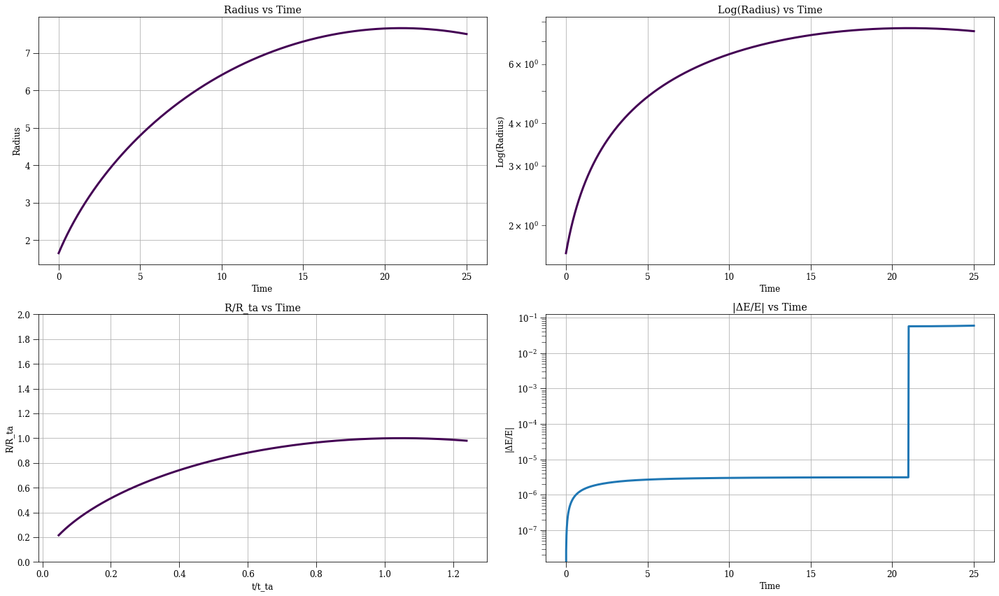

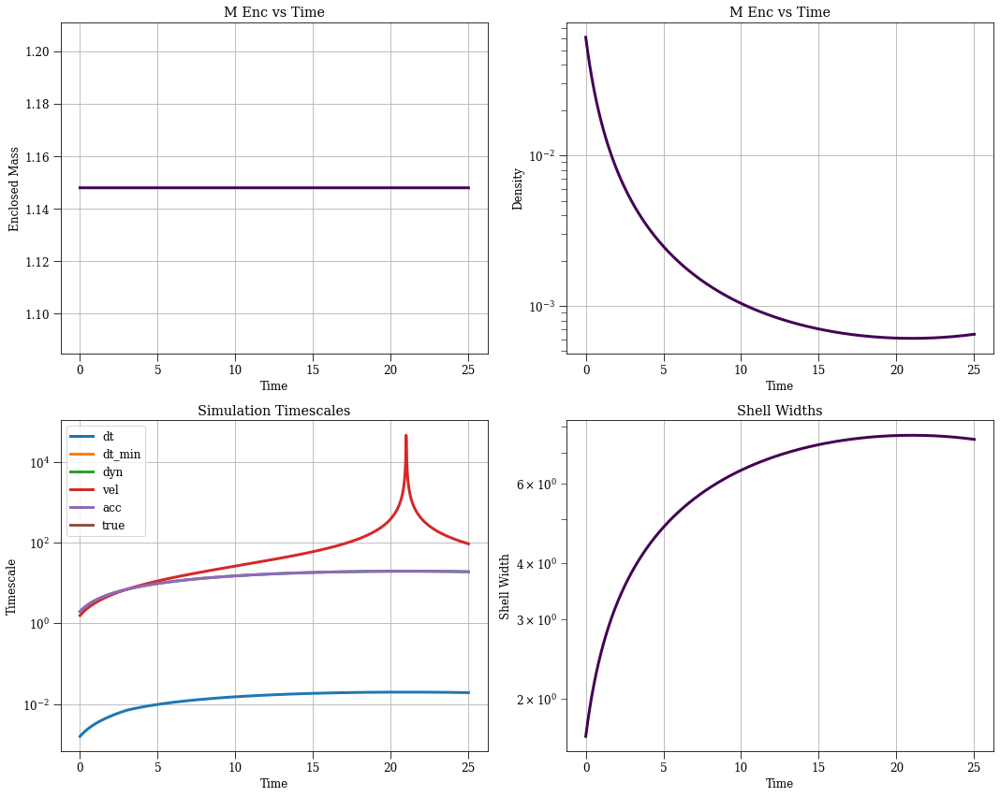

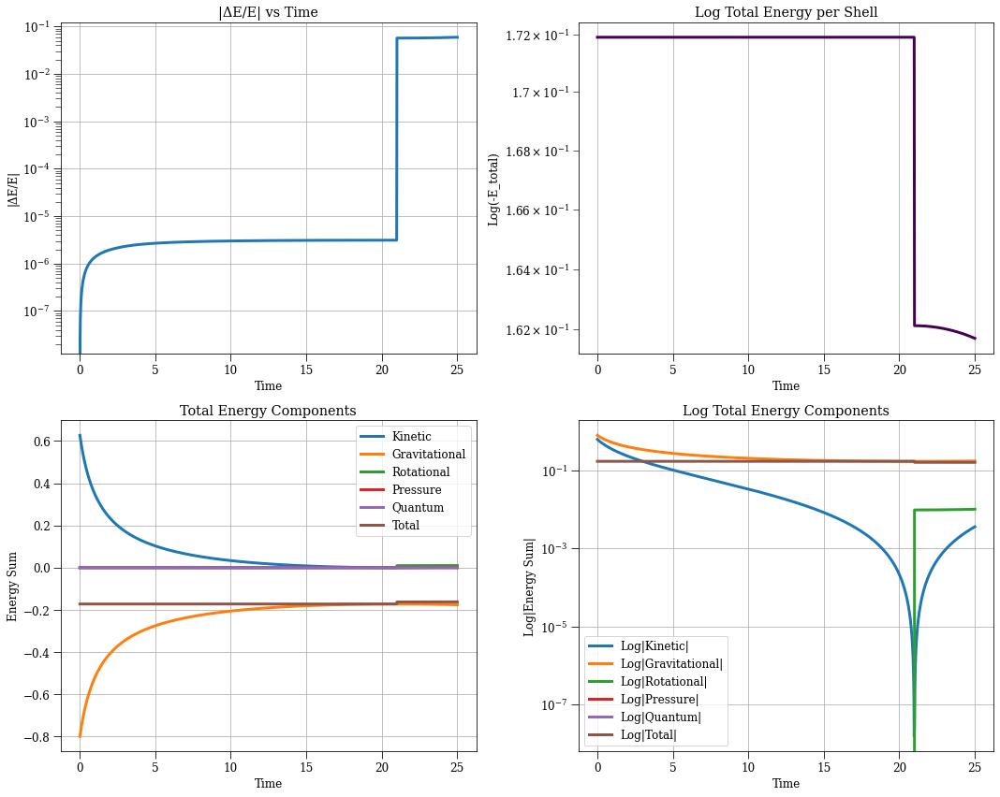

In [36]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-11.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.5,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filen

2025-10-24 09:23:46,266 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:1487: RuntimeWarning: invalid value encountered in log
  y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)
2025-10-24 09:33:21,630 - DEBUG - Saved dataset t with shape (2501,)
2025-10-24 09:33:21,632 - DEBUG - Saved dataset dt with shape (2501,)
2025-10-24 09:33:21,667 - DEBUG - Saved dataset r with shape (2501, 1000)


2025-10-24 09:33:21,690 - DEBUG - Saved dataset v with shape (2501, 1000)
2025-10-24 09:33:21,713 - DEBUG - Saved dataset a with shape (2501, 1000)
2025-10-24 09:33:21,736 - DEBUG - Saved dataset m_enc with shape (2501, 1000)
2025-10-24 09:33:21,758 - DEBUG - Saved dataset rho_r with shape (2501, 1000)
2025-10-24 09:33:21,759 - WARNING - Skipping pressure because all values are None
2025-10-24 09:33:21,760 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 09:33:21,760 - WARNING - Skipping rho_prime because all values are None
2025-10-24 09:33:21,784 - DEBUG - Saved dataset e_tot with shape (2501, 1000)
2025-10-24 09:33:21,806 - DEBUG - Saved dataset e_g with shape (2501, 1000)
2025-10-24 09:33:21,826 - DEBUG - Saved dataset e_k with shape (2501, 1000)
2025-10-24 09:33:21,846 - DEBUG - Saved dataset e_r with shape (2501, 1000)
2025-10-24 09:33:21,847 - WARNING - Skipping e_p because all values are None
2025-10-24 09:33:21,868 - DEBUG - Saved dataset e_q with sha

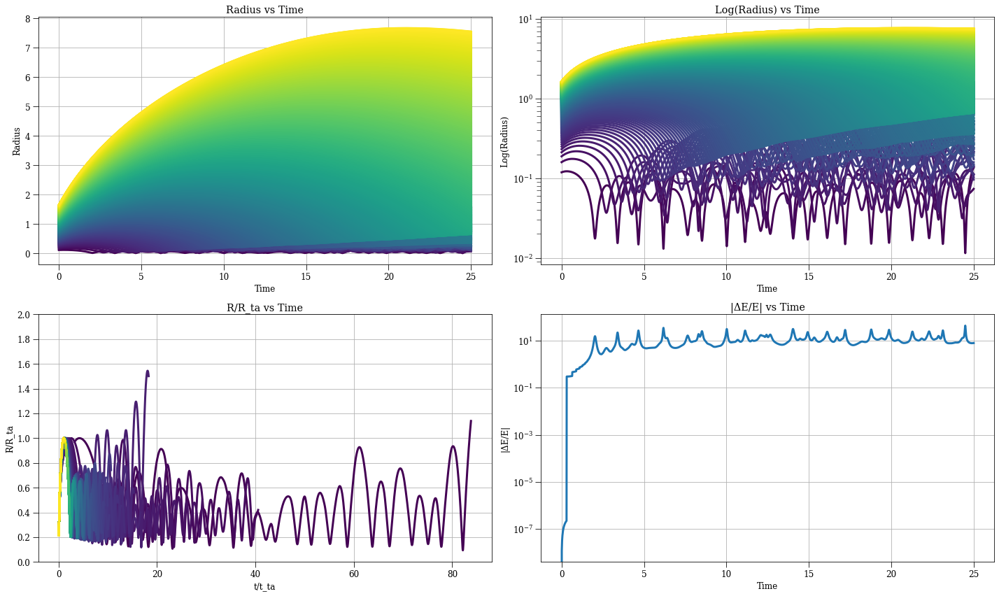

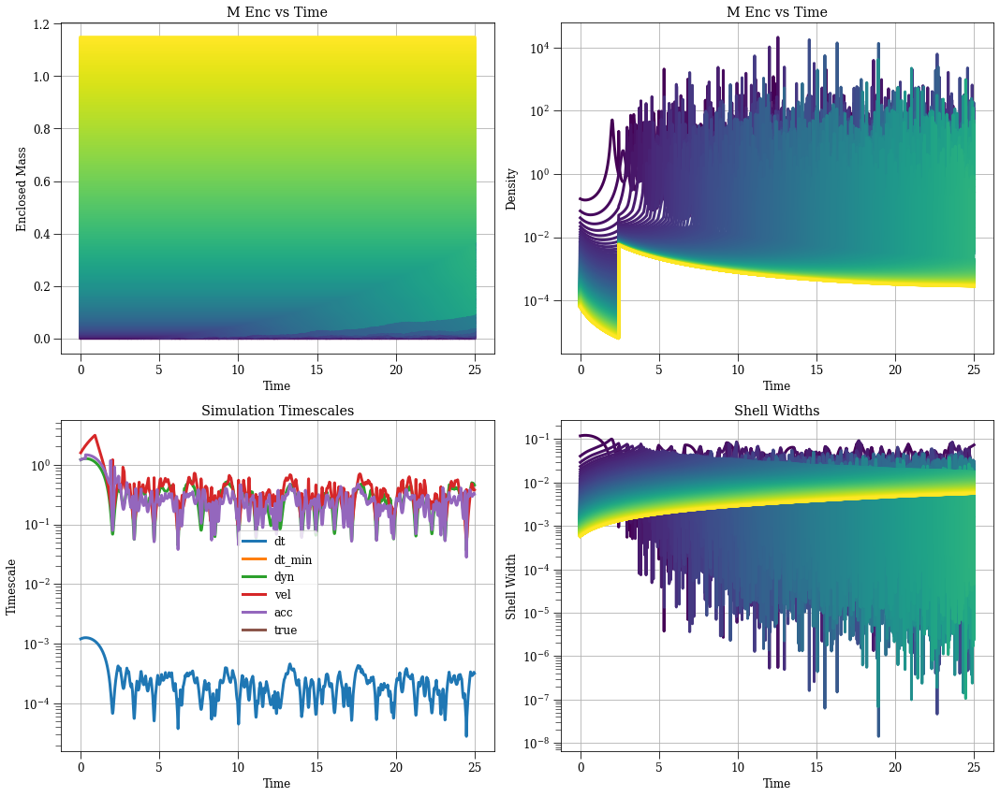

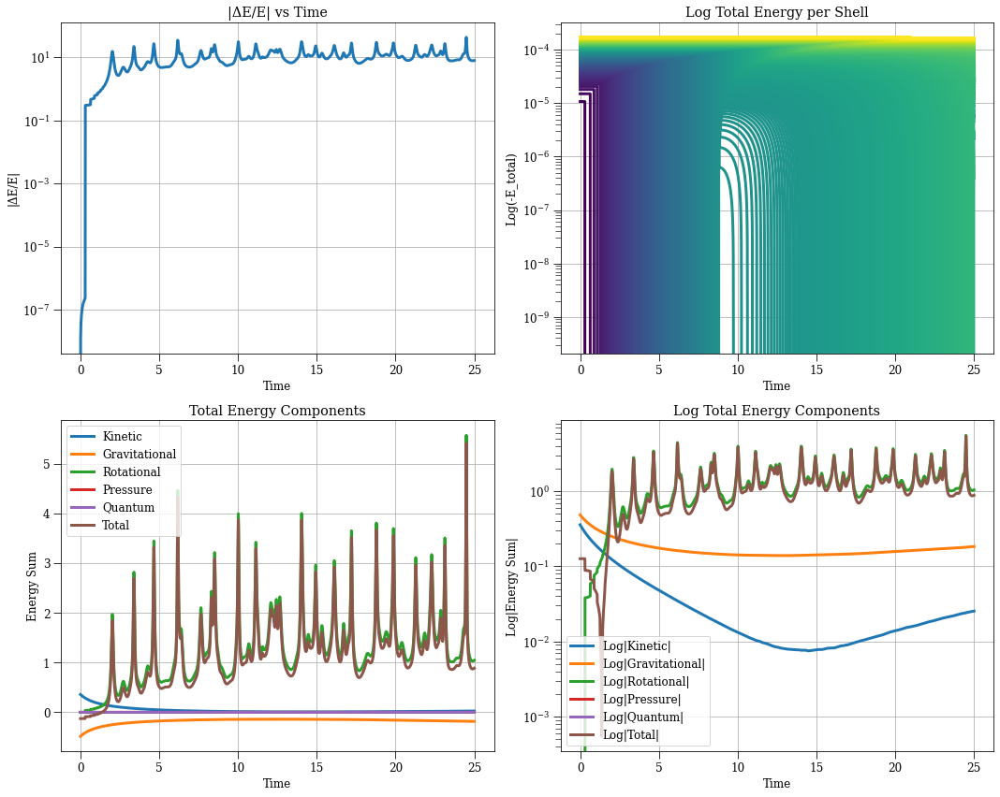

In [26]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-10.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.7,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filen

2025-10-24 09:12:59,683 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:1487: RuntimeWarning: invalid value encountered in log
  y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)
2025-10-24 09:16:45,207 - DEBUG - Saved dataset t with shape (2501,)
2025-10-24 09:16:45,209 - DEBUG - Saved dataset dt with shape (2501,)
2025-10-24 09:16:45,245 - DEBUG - Saved dataset r with shape (2501, 1000)
2025-10-24 09:16:45,271 - DEBUG - Saved dataset v with shape (2501, 1000)


2025-10-24 09:16:45,296 - DEBUG - Saved dataset a with shape (2501, 1000)
2025-10-24 09:16:45,316 - DEBUG - Saved dataset m_enc with shape (2501, 1000)
2025-10-24 09:16:45,335 - DEBUG - Saved dataset rho_r with shape (2501, 1000)
2025-10-24 09:16:45,336 - WARNING - Skipping pressure because all values are None
2025-10-24 09:16:45,337 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 09:16:45,338 - WARNING - Skipping rho_prime because all values are None
2025-10-24 09:16:45,357 - DEBUG - Saved dataset e_tot with shape (2501, 1000)
2025-10-24 09:16:45,376 - DEBUG - Saved dataset e_g with shape (2501, 1000)
2025-10-24 09:16:45,395 - DEBUG - Saved dataset e_k with shape (2501, 1000)
2025-10-24 09:16:45,415 - DEBUG - Saved dataset e_r with shape (2501, 1000)
2025-10-24 09:16:45,416 - WARNING - Skipping e_p because all values are None
2025-10-24 09:16:45,434 - DEBUG - Saved dataset e_q with shape (2501, 1000)
2025-10-24 09:16:45,436 - DEBUG - Saved dataset t_dyn with

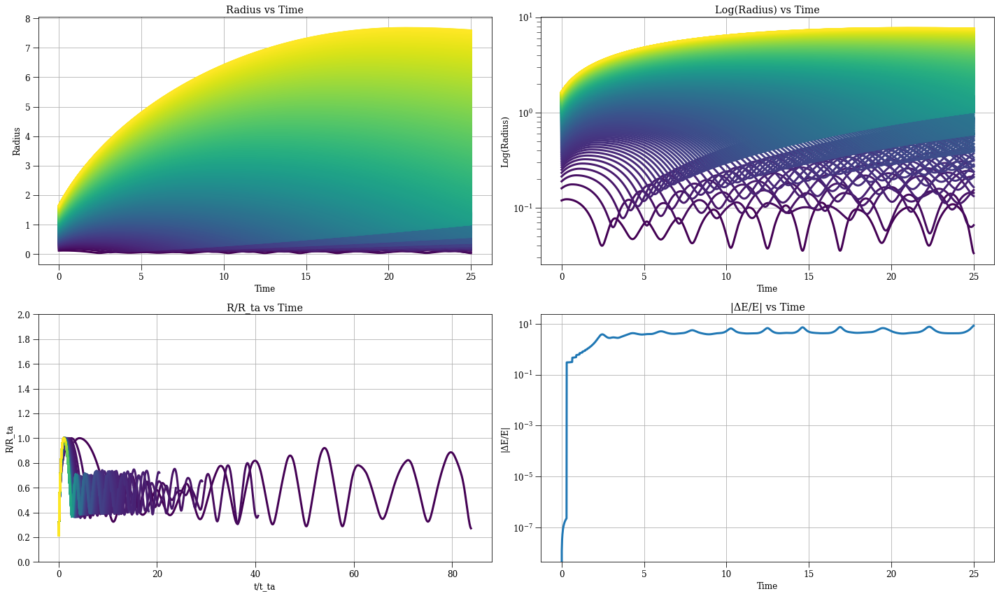

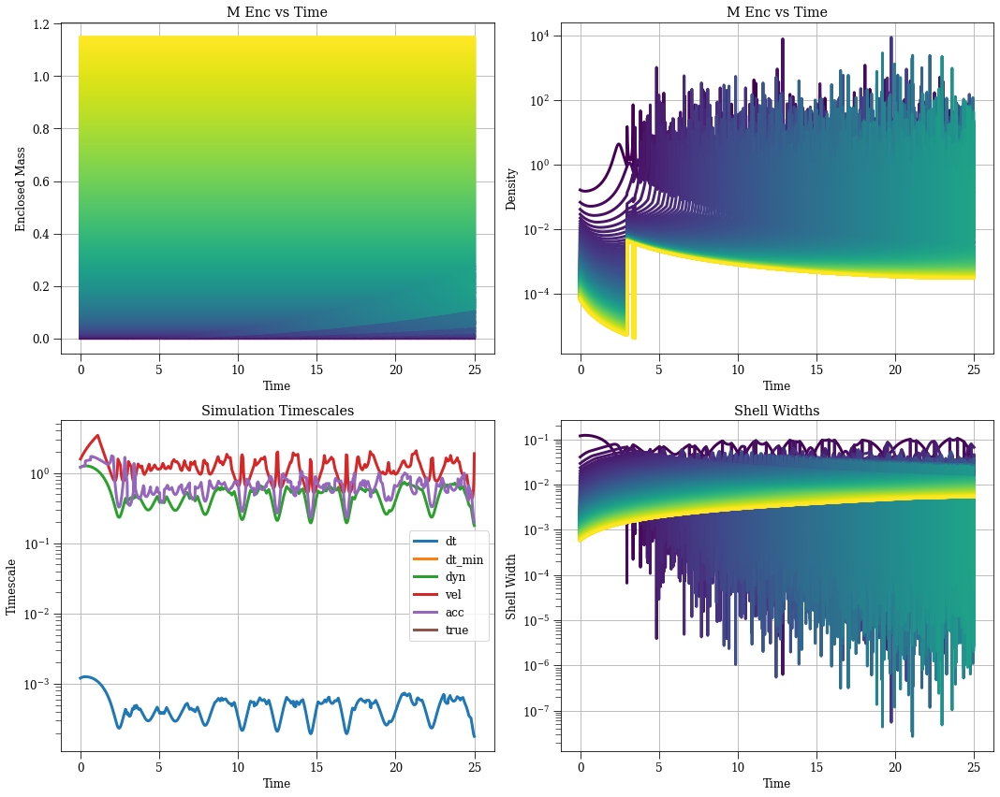

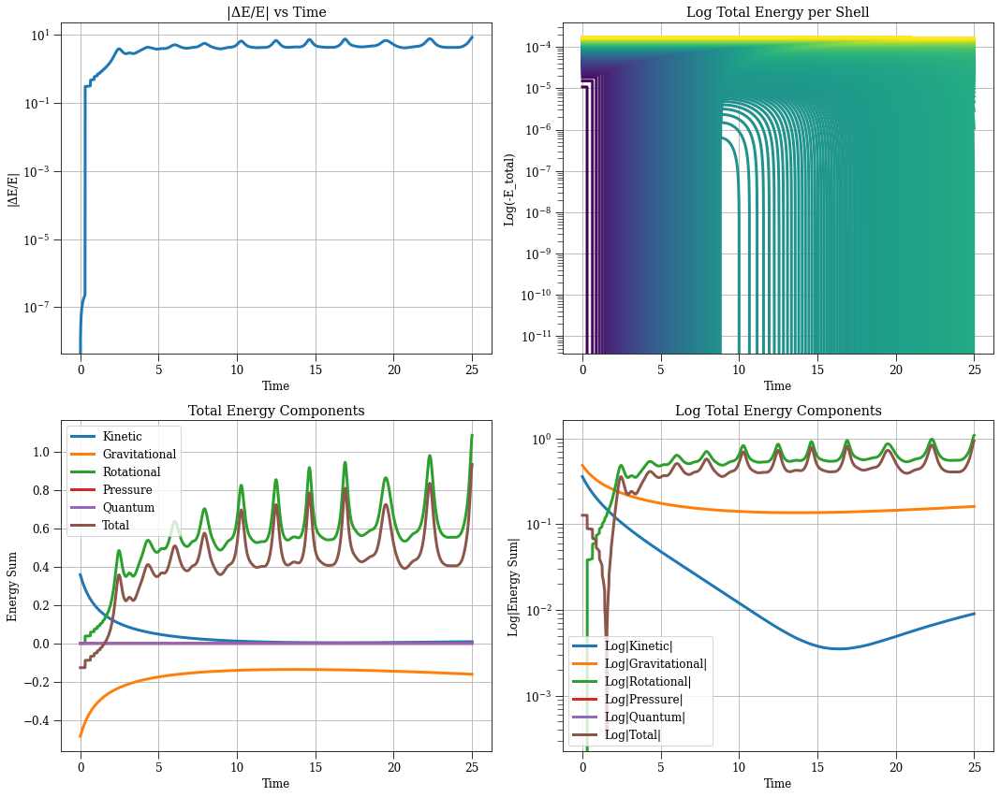

In [19]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-10.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 04:01:03,335 - collapse - INFO - Simulation setup complete


2025-10-24 05:24:06,345 - DEBUG - Saved dataset t with shape (2501,)
2025-10-24 05:24:06,347 - DEBUG - Saved dataset dt with shape (2501,)
2025-10-24 05:24:06,393 - DEBUG - Saved dataset r with shape (2501, 1000)
2025-10-24 05:24:06,429 - DEBUG - Saved dataset v with shape (2501, 1000)
2025-10-24 05:24:06,452 - DEBUG - Saved dataset a with shape (2501, 1000)
2025-10-24 05:24:06,473 - DEBUG - Saved dataset m_enc with shape (2501, 1000)
2025-10-24 05:24:06,495 - DEBUG - Saved dataset rho_r with shape (2501, 1000)
2025-10-24 05:24:06,496 - WARNING - Skipping pressure because all values are None


2025-10-24 05:24:06,497 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 05:24:06,498 - WARNING - Skipping rho_prime because all values are None
2025-10-24 05:24:06,520 - DEBUG - Saved dataset e_tot with shape (2501, 1000)
2025-10-24 05:24:06,554 - DEBUG - Saved dataset e_g with shape (2501, 1000)
2025-10-24 05:24:06,588 - DEBUG - Saved dataset e_k with shape (2501, 1000)
2025-10-24 05:24:06,617 - DEBUG - Saved dataset e_r with shape (2501, 1000)
2025-10-24 05:24:06,618 - WARNING - Skipping e_p because all values are None
2025-10-24 05:24:06,645 - DEBUG - Saved dataset e_q with shape (2501, 1000)
2025-10-24 05:24:06,647 - DEBUG - Saved dataset t_dyn with shape (2501,)
2025-10-24 05:24:06,648 - DEBUG - Saved dataset t_vel with shape (2501,)
2025-10-24 05:24:06,650 - DEBUG - Saved dataset t_acc with shape (2501,)
2025-10-24 05:24:06,651 - WARNING - Skipping t_cross because all values are None
2025-10-24 05:24:06,652 - WARNING - Skipping t_crossa because all valu

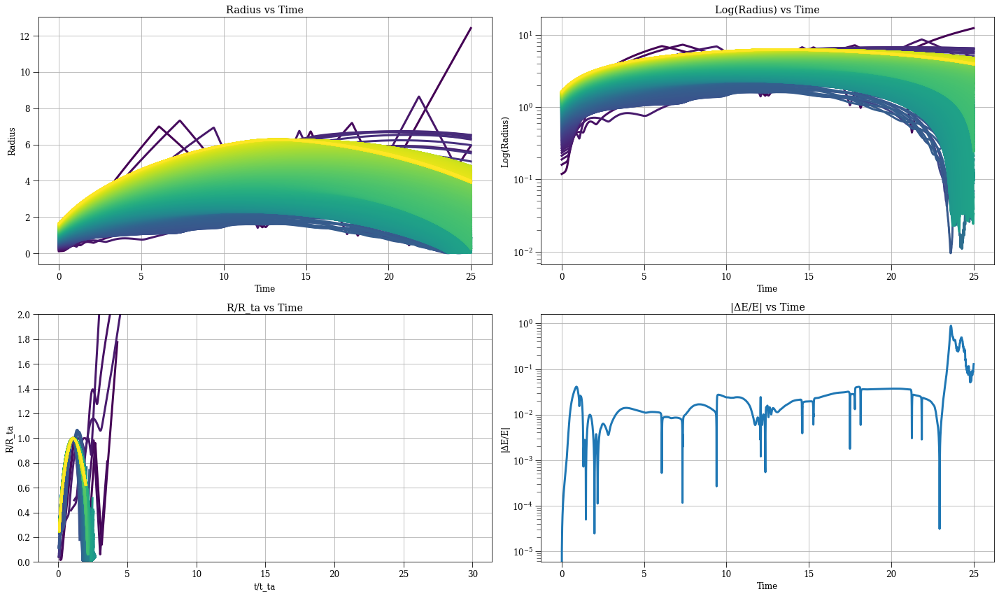

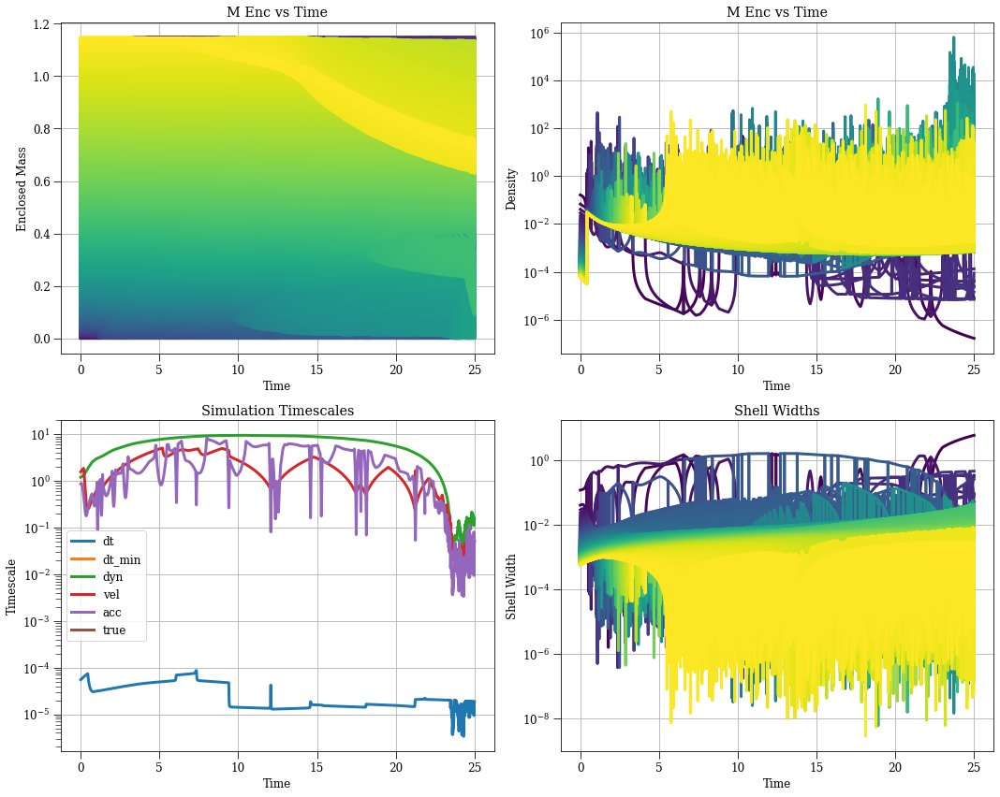

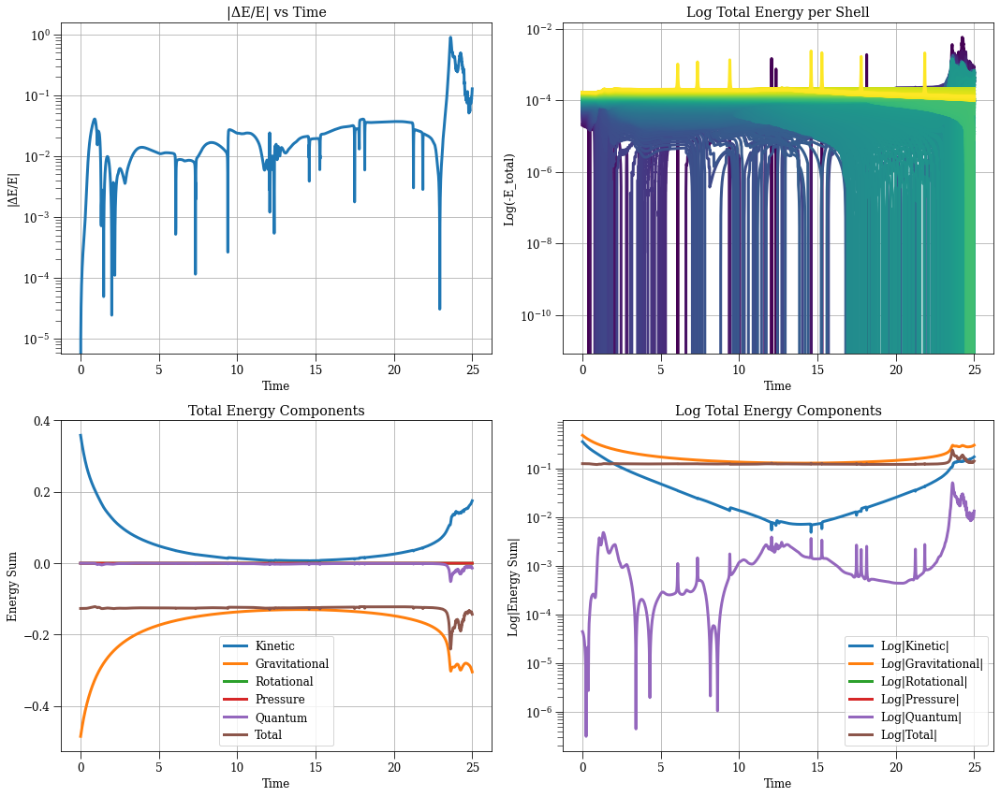

In [10]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-9.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 03:45:14,006 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:1523: RuntimeWarning: invalid value encountered in log
  y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)
2025-10-24 03:54:57,461 - DEBUG - Saved dataset t with shape (2501,)
2025-10-24 03:54:57,463 - DEBUG - Saved dataset dt with shape (2501,)
2025-10-24 03:54:57,513 - DEBUG - Saved dataset r with shape (2501, 1000)
2025-10-24 03:54:57,551 - DEBUG - Saved dataset v with shape (2501, 1000)
2025-10-24 03:54:57,577 - DEBUG - Saved dataset a with shape (2501, 1000)
2025-10-24 03:54:57,600 - DEBUG - Saved dataset m_enc with shape (2501, 1000)


2025-10-24 03:54:57,623 - DEBUG - Saved dataset rho_r with shape (2501, 1000)
2025-10-24 03:54:57,625 - WARNING - Skipping pressure because all values are None
2025-10-24 03:54:57,626 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 03:54:57,626 - WARNING - Skipping rho_prime because all values are None
2025-10-24 03:54:57,652 - DEBUG - Saved dataset e_tot with shape (2501, 1000)
2025-10-24 03:54:57,677 - DEBUG - Saved dataset e_g with shape (2501, 1000)
2025-10-24 03:54:57,700 - DEBUG - Saved dataset e_k with shape (2501, 1000)
2025-10-24 03:54:57,722 - DEBUG - Saved dataset e_r with shape (2501, 1000)
2025-10-24 03:54:57,723 - WARNING - Skipping e_p because all values are None
2025-10-24 03:54:57,746 - DEBUG - Saved dataset e_q with shape (2501, 1000)
2025-10-24 03:54:57,747 - DEBUG - Saved dataset t_dyn with shape (2501,)
2025-10-24 03:54:57,748 - DEBUG - Saved dataset t_vel with shape (2501,)
2025-10-24 03:54:57,750 - DEBUG - Saved dataset t_acc with shape

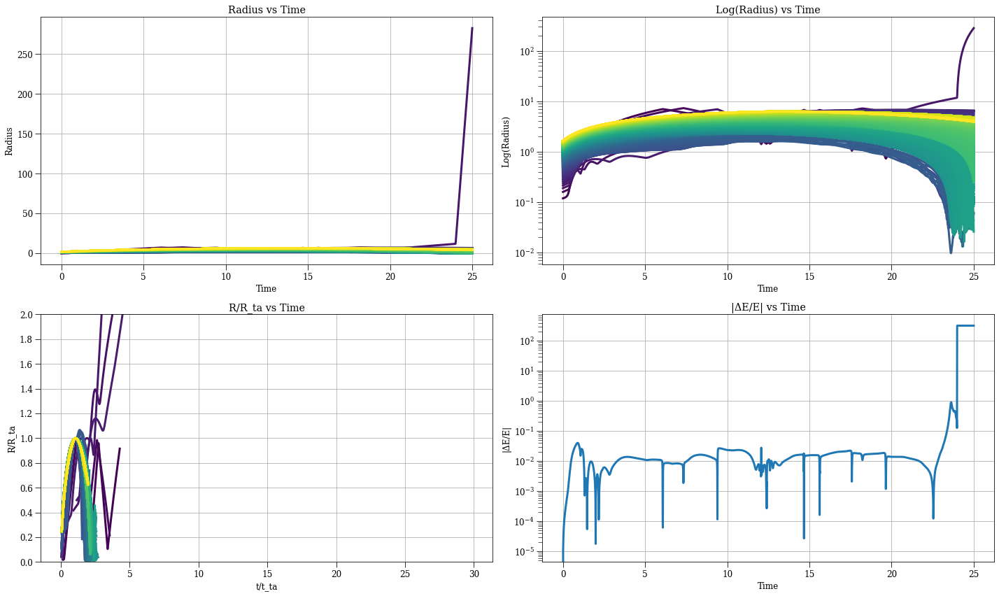

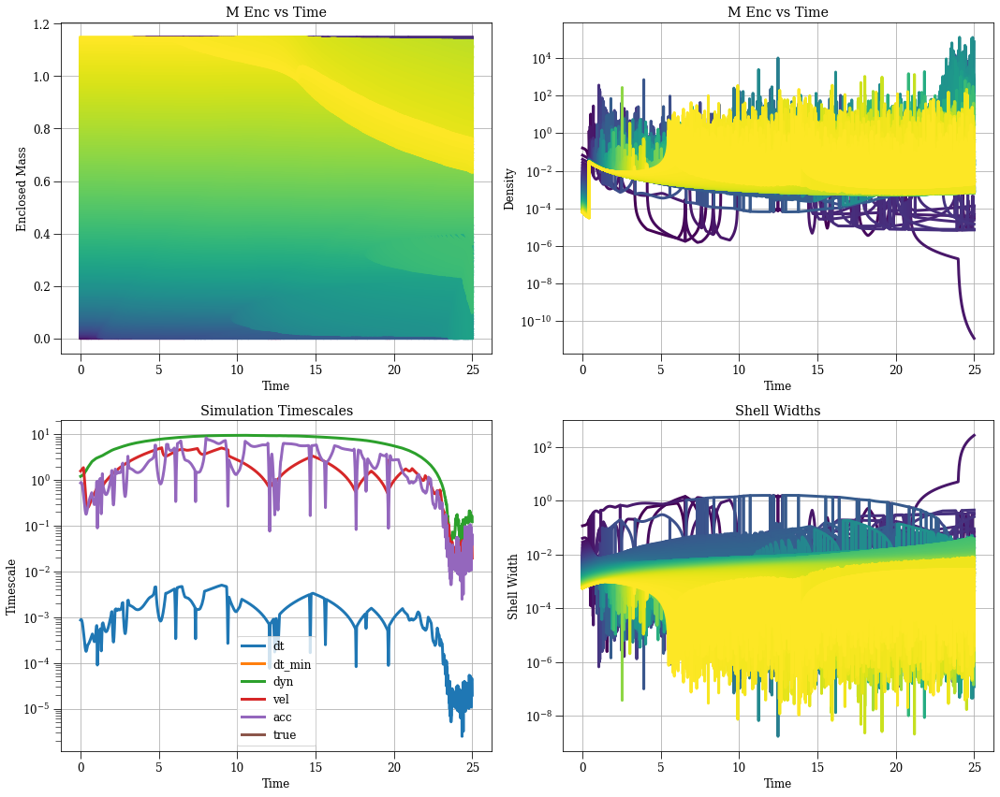

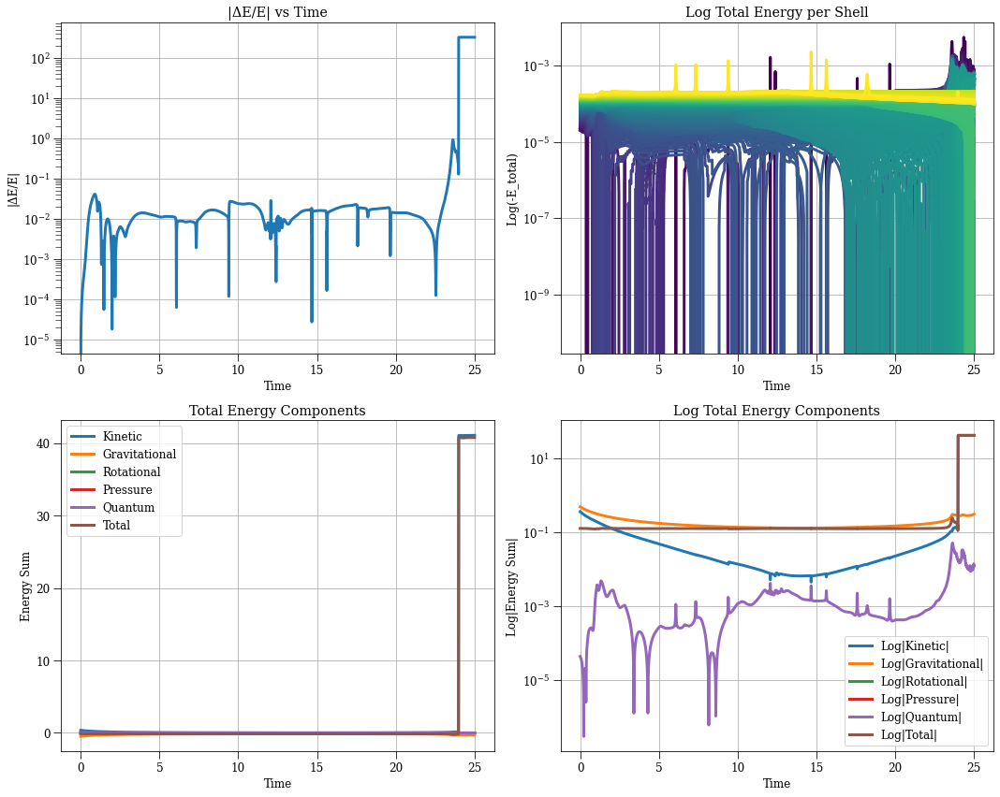

In [5]:
# s=0.1
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-8.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 03:36:59,061 - collapse - INFO - Simulation setup complete


KeyboardInterrupt: 

In [36]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-6.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 03:01:46,143 - collapse - INFO - Simulation setup complete


KeyboardInterrupt: 

In [37]:
r_max = 1.65
j_coef = 0e-3
N = 1000
t_max = 25
safety_factor = 1e-3
save_dt = 1e-2
delta = 0.15
irs = 'equal_mass'
ivs = 'peculiar'
density_strategy = 'background_plus_power_law_total'
accel_strategy, ang_mom_strategy = 'fdm4', 'const' 
energy_strategy = 'kin_grav_rot_fdm_absorbed'
softlen = 0
hbar2_over_m2 = (6e-2)**2
problematic_shell_strategy = 'nothing'

tss = 'dyn_vel_acc'
mes = 'neighbor2'
save_strategy = 'default'
r_min = 0
gamma = -1
thickness_coef = 0

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'neighbor2',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 03:04:42,347 - collapse - INFO - Simulation setup complete


2025-10-24 03:09:10,390 - DEBUG - Saved dataset t with shape (2501,)
2025-10-24 03:09:10,392 - DEBUG - Saved dataset dt with shape (2501,)
2025-10-24 03:09:10,439 - DEBUG - Saved dataset r with shape (2501, 1000)
2025-10-24 03:09:10,474 - DEBUG - Saved dataset v with shape (2501, 1000)
2025-10-24 03:09:10,509 - DEBUG - Saved dataset a with shape (2501, 1000)
2025-10-24 03:09:10,552 - DEBUG - Saved dataset m_enc with shape (2501, 1000)


2025-10-24 03:09:10,592 - DEBUG - Saved dataset rho_r with shape (2501, 1000)
2025-10-24 03:09:10,594 - WARNING - Skipping pressure because all values are None
2025-10-24 03:09:10,595 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 03:09:10,596 - WARNING - Skipping rho_prime because all values are None
2025-10-24 03:09:10,632 - DEBUG - Saved dataset e_tot with shape (2501, 1000)
2025-10-24 03:09:10,663 - DEBUG - Saved dataset e_g with shape (2501, 1000)
2025-10-24 03:09:10,691 - DEBUG - Saved dataset e_k with shape (2501, 1000)
2025-10-24 03:09:10,717 - DEBUG - Saved dataset e_r with shape (2501, 1000)
2025-10-24 03:09:10,718 - WARNING - Skipping e_p because all values are None
2025-10-24 03:09:10,746 - DEBUG - Saved dataset e_q with shape (2501, 1000)
2025-10-24 03:09:10,748 - DEBUG - Saved dataset t_dyn with shape (2501,)
2025-10-24 03:09:10,749 - DEBUG - Saved dataset t_vel with shape (2501,)
2025-10-24 03:09:10,750 - DEBUG - Saved dataset t_acc with shape

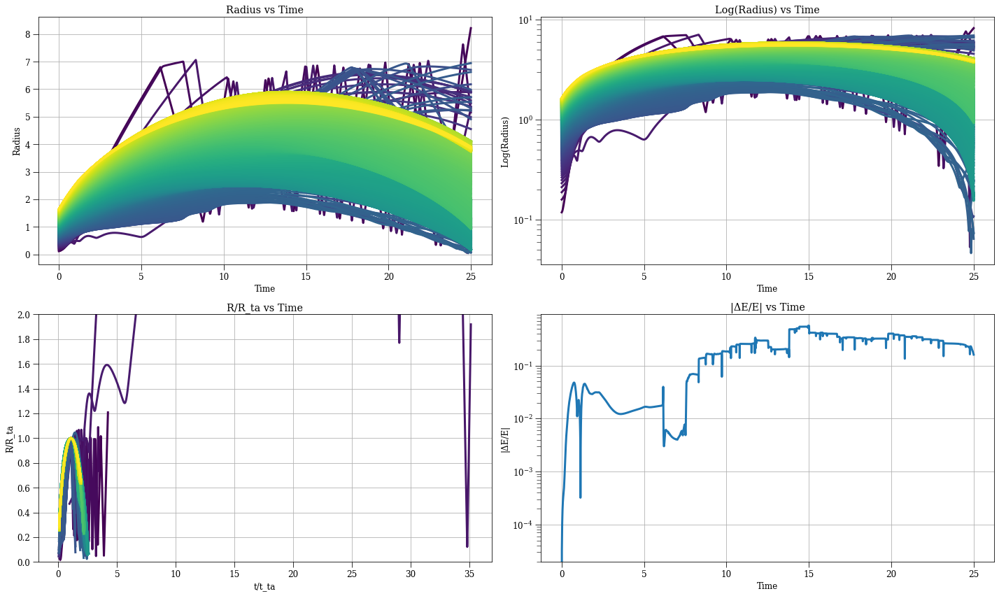

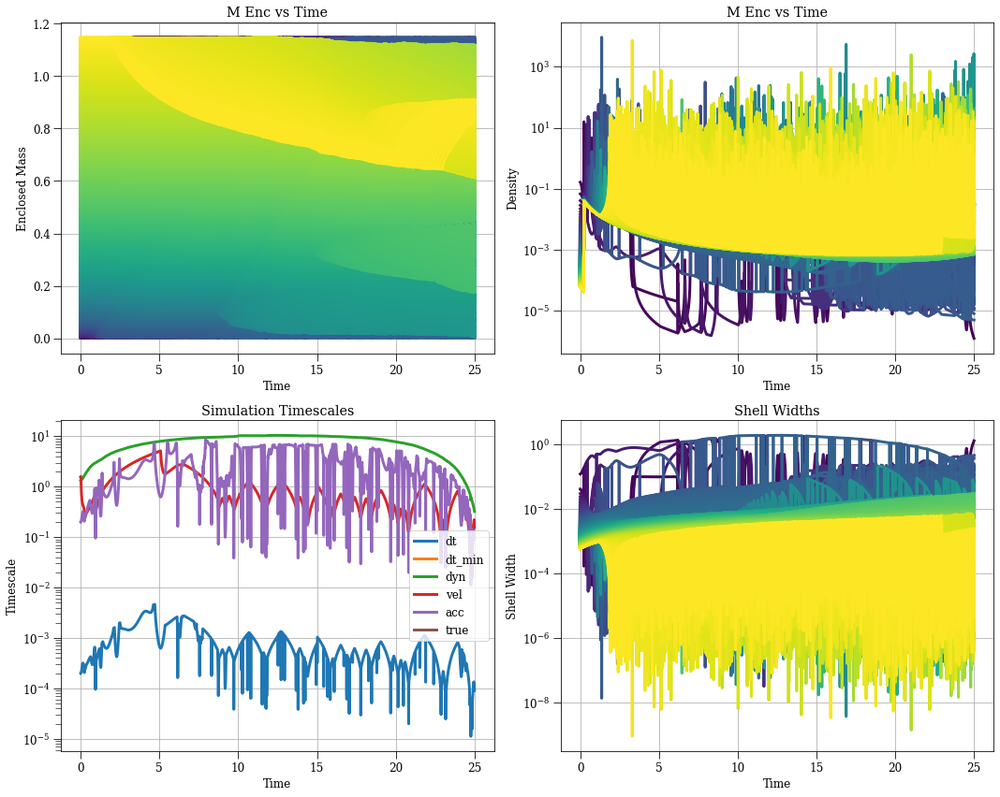

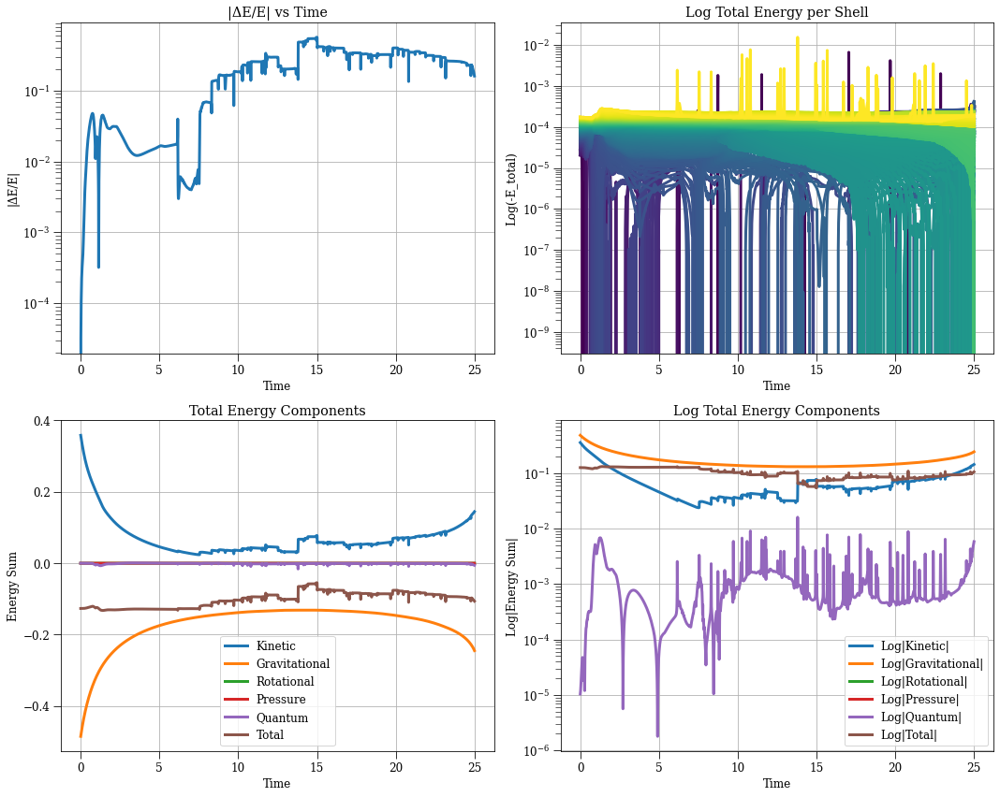

In [38]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-7.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 02:50:58,002 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:1523: RuntimeWarning: invalid value encountered in log
  y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)
2025-10-24 03:00:34,987 - DEBUG - Saved dataset t with shape (2501,)
2025-10-24 03:00:34,989 - DEBUG - Saved dataset dt with shape (2501,)
2025-10-24 03:00:35,045 - DEBUG - Saved dataset r with shape (2501, 1000)
2025-10-24 03:00:35,086 - DEBUG - Saved dataset v with shape (2501, 1000)
2025-10-24 03:00:35,112 - DEBUG - Saved dataset a with shape (2501, 1000)
2025-10-24 03:00:35,135 - DEBUG - Saved dataset m_enc with shape (2501, 1000)


2025-10-24 03:00:35,158 - DEBUG - Saved dataset rho_r with shape (2501, 1000)
2025-10-24 03:00:35,159 - WARNING - Skipping pressure because all values are None
2025-10-24 03:00:35,160 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 03:00:35,161 - WARNING - Skipping rho_prime because all values are None
2025-10-24 03:00:35,185 - DEBUG - Saved dataset e_tot with shape (2501, 1000)
2025-10-24 03:00:35,208 - DEBUG - Saved dataset e_g with shape (2501, 1000)
2025-10-24 03:00:35,230 - DEBUG - Saved dataset e_k with shape (2501, 1000)
2025-10-24 03:00:35,253 - DEBUG - Saved dataset e_r with shape (2501, 1000)
2025-10-24 03:00:35,254 - WARNING - Skipping e_p because all values are None
2025-10-24 03:00:35,275 - DEBUG - Saved dataset e_q with shape (2501, 1000)
2025-10-24 03:00:35,277 - DEBUG - Saved dataset t_dyn with shape (2501,)
2025-10-24 03:00:35,278 - DEBUG - Saved dataset t_vel with shape (2501,)
2025-10-24 03:00:35,279 - DEBUG - Saved dataset t_acc with shape

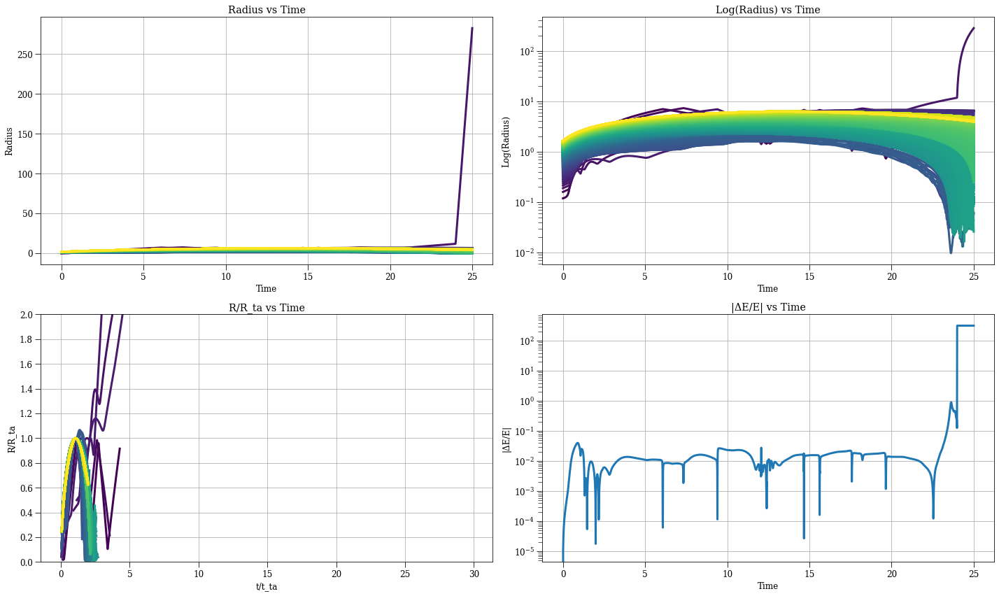

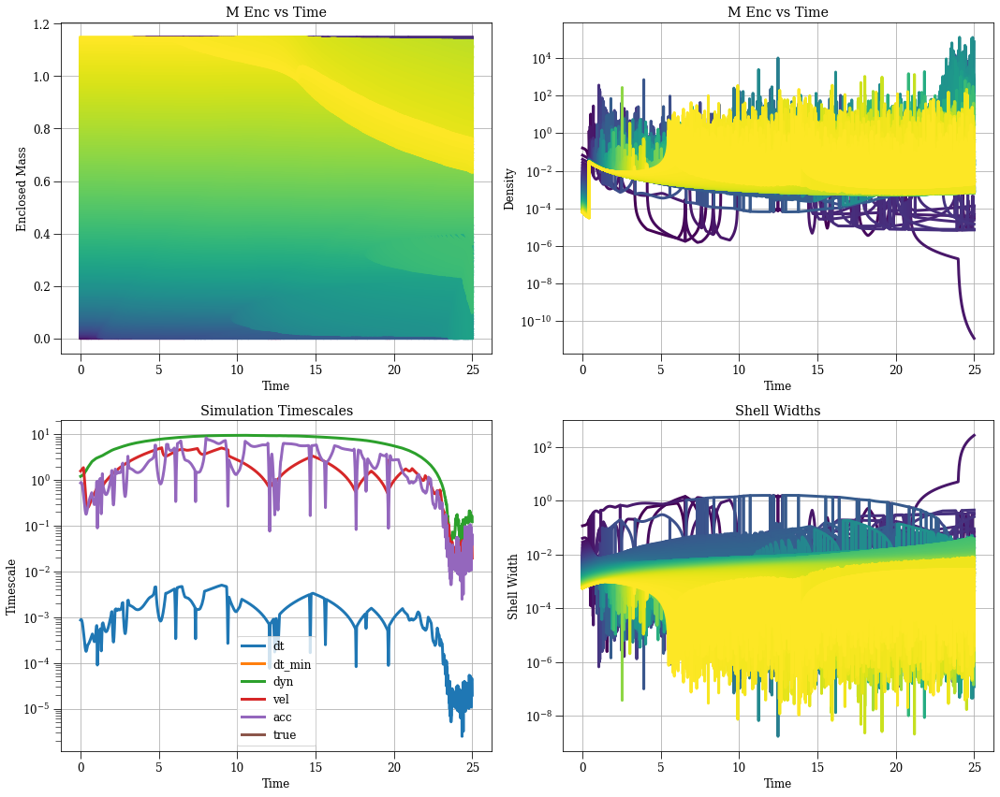

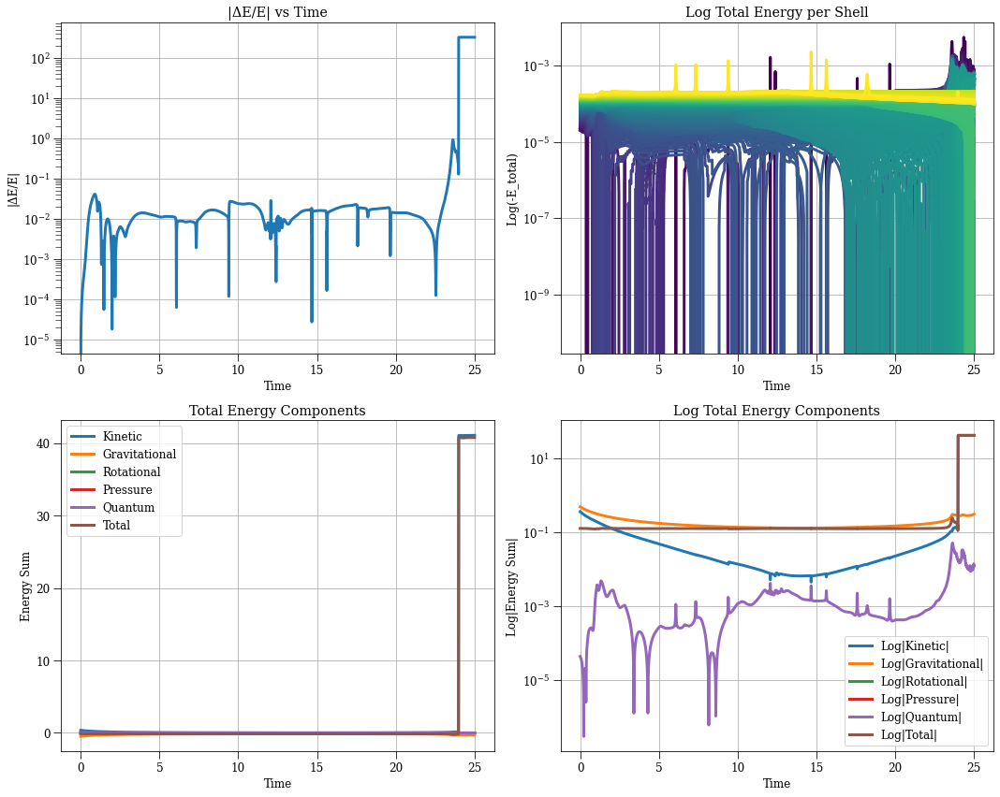

In [32]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-5.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'neighbor2',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 02:46:13,980 - collapse - INFO - Simulation setup complete


2025-10-24 02:46:43,454 - DEBUG - Saved dataset t with shape (501,)
2025-10-24 02:46:43,455 - DEBUG - Saved dataset dt with shape (501,)
2025-10-24 02:46:43,462 - DEBUG - Saved dataset r with shape (501, 1000)
2025-10-24 02:46:43,467 - DEBUG - Saved dataset v with shape (501, 1000)
2025-10-24 02:46:43,472 - DEBUG - Saved dataset a with shape (501, 1000)
2025-10-24 02:46:43,477 - DEBUG - Saved dataset m_enc with shape (501, 1000)
2025-10-24 02:46:43,482 - DEBUG - Saved dataset rho_r with shape (501, 1000)
2025-10-24 02:46:43,482 - WARNING - Skipping pressure because all values are None
2025-10-24 02:46:43,483 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 02:46:43,483 - WARNING - Skipping rho_prime because all values are None
2025-10-24 02:46:43,488 - DEBUG - Saved dataset e_tot with shape (501, 1000)
2025-10-24 02:46:43,493 - DEBUG - Saved dataset e_g with shape (501, 1000)
2025-10-24 02:46:43,497 - DEBUG - Saved dataset e_k with shape (501, 1000)
2025-10-24

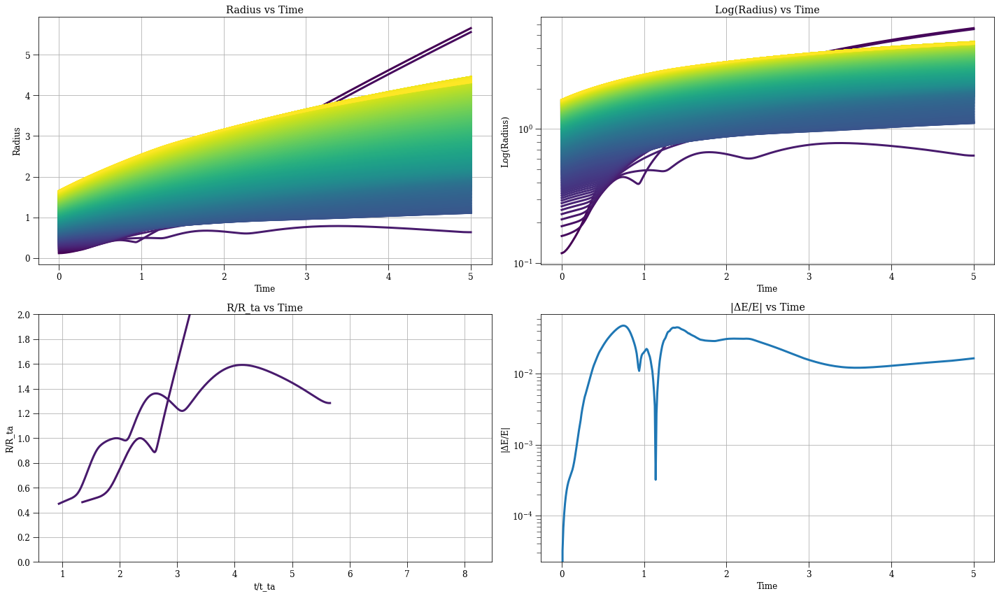

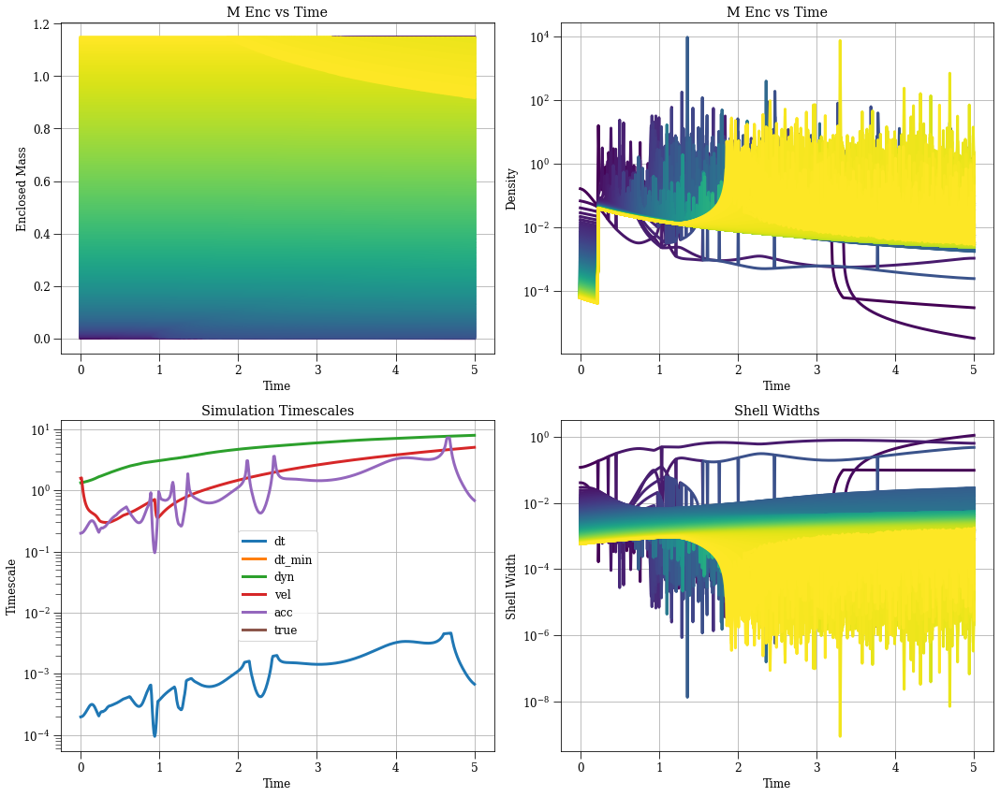

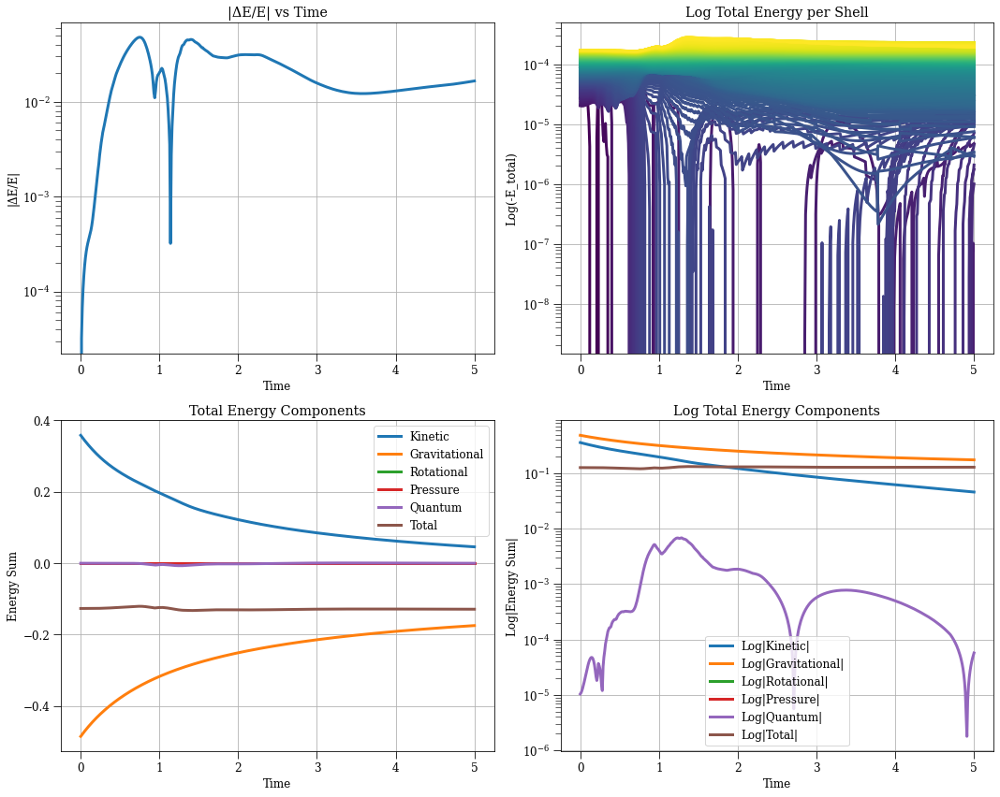

In [28]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-4.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 02:36:20,327 - collapse - INFO - Simulation setup complete


2025-10-24 02:44:42,271 - DEBUG - Saved dataset t with shape (501,)
2025-10-24 02:44:42,273 - DEBUG - Saved dataset dt with shape (501,)
2025-10-24 02:44:42,283 - DEBUG - Saved dataset r with shape (501, 1000)
2025-10-24 02:44:42,292 - DEBUG - Saved dataset v with shape (501, 1000)
2025-10-24 02:44:42,300 - DEBUG - Saved dataset a with shape (501, 1000)
2025-10-24 02:44:42,308 - DEBUG - Saved dataset m_enc with shape (501, 1000)
2025-10-24 02:44:42,315 - DEBUG - Saved dataset rho_r with shape (501, 1000)
2025-10-24 02:44:42,316 - WARNING - Skipping pressure because all values are None
2025-10-24 02:44:42,316 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 02:44:42,317 - WARNING - Skipping rho_prime because all values are None
2025-10-24 02:44:42,325 - DEBUG - Saved dataset e_tot with shape (501, 1000)
2025-10-24 02:44:42,331 - DEBUG - Saved dataset e_g with shape (501, 1000)
2025-10-24 02:44:42,338 - DEBUG - Saved dataset e_k with shape (501, 1000)
2025-10-24

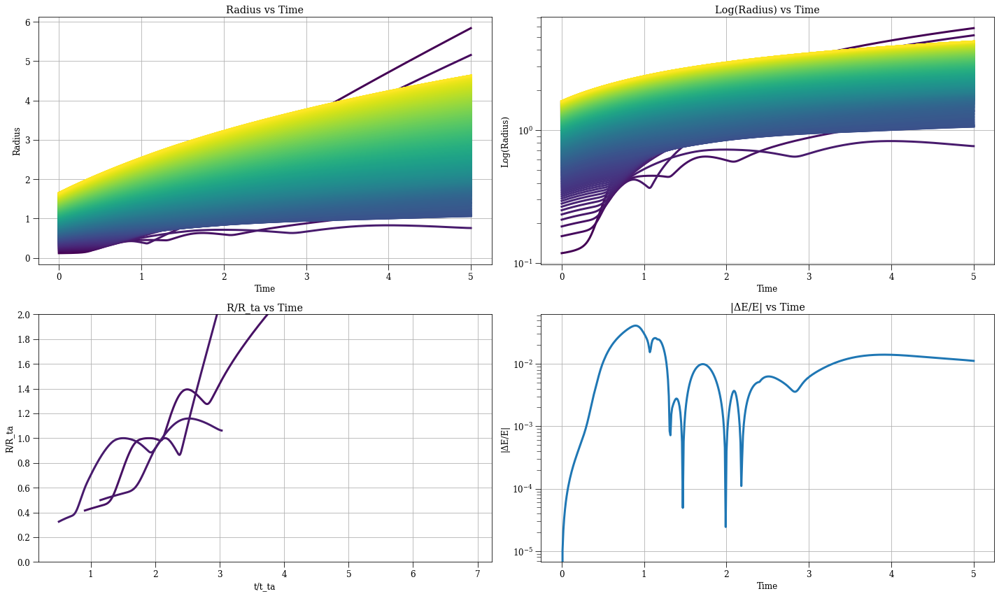

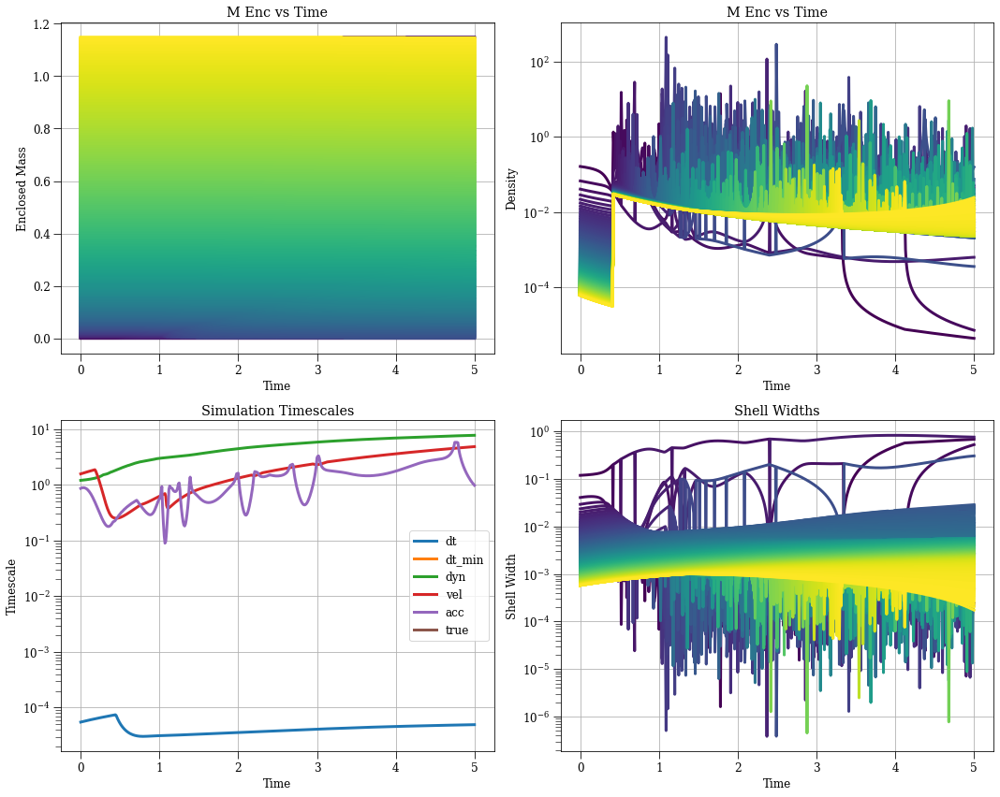

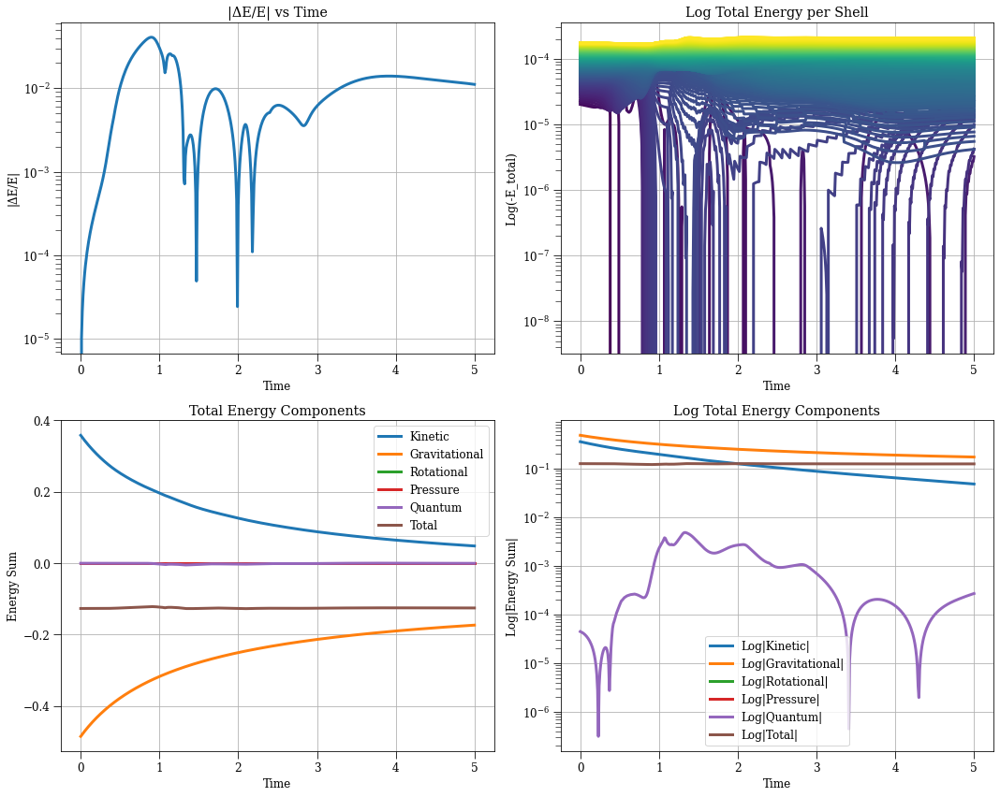

In [26]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-3.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'fdm4',
 'ang_mom_strategy': 'const',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.0,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filename': '10-23-

2025-10-24 02:34:48,350 - collapse - INFO - Simulation setup complete


2025-10-24 02:35:20,028 - DEBUG - Saved dataset t with shape (501,)
2025-10-24 02:35:20,030 - DEBUG - Saved dataset dt with shape (501,)
2025-10-24 02:35:20,042 - DEBUG - Saved dataset r with shape (501, 1000)
2025-10-24 02:35:20,050 - DEBUG - Saved dataset v with shape (501, 1000)
2025-10-24 02:35:20,058 - DEBUG - Saved dataset a with shape (501, 1000)
2025-10-24 02:35:20,065 - DEBUG - Saved dataset m_enc with shape (501, 1000)
2025-10-24 02:35:20,072 - DEBUG - Saved dataset rho_r with shape (501, 1000)
2025-10-24 02:35:20,073 - WARNING - Skipping pressure because all values are None
2025-10-24 02:35:20,074 - WARNING - Skipping dpressure_drho because all values are None
2025-10-24 02:35:20,075 - WARNING - Skipping rho_prime because all values are None
2025-10-24 02:35:20,085 - DEBUG - Saved dataset e_tot with shape (501, 1000)
2025-10-24 02:35:20,095 - DEBUG - Saved dataset e_g with shape (501, 1000)
2025-10-24 02:35:20,102 - DEBUG - Saved dataset e_k with shape (501, 1000)
2025-10-24

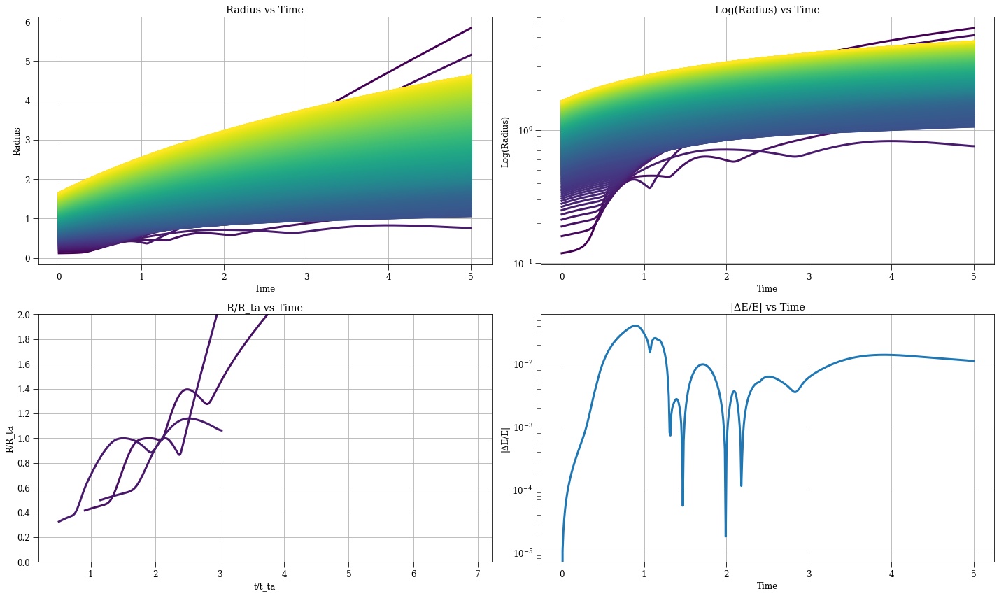

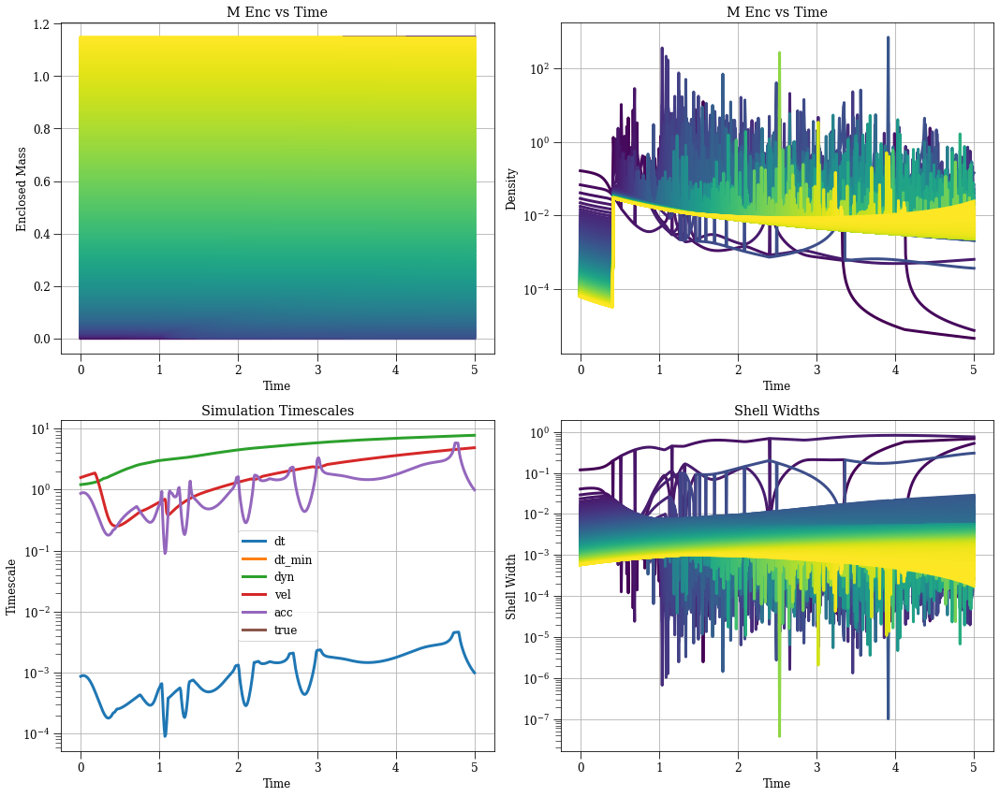

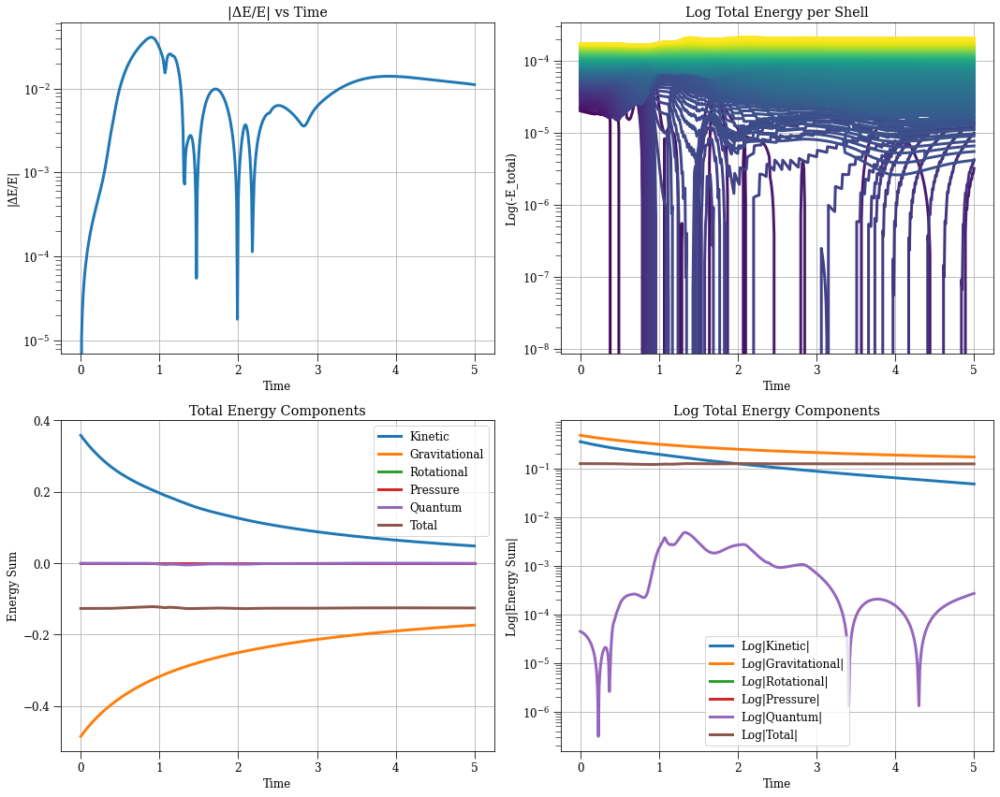

In [24]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-2.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

2025-10-23 18:32:42,458 - collapse - INFO - Simulation setup complete


{'G': 1,
 'H': 0.6666666666666666,
 'N': 100,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'r0min_start_equal',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'kernel',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.0165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_fil

/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/scipy/interpolate/fitpack2.py:279: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/scipy/interpolate/fitpack2.py:279: UserWarning: 
A theoretically impossible result was found during the iteration
process for finding a smoothing spline with fp = s: s too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
2025-10-23 18:54:53,383 - DEBUG - Saved dataset t with shape (501,)
2025-10-23 18:54:53,385 - DEBUG - Saved dataset dt with shape (501,)
2025-10-23 18:54:53,389 - DEBUG -

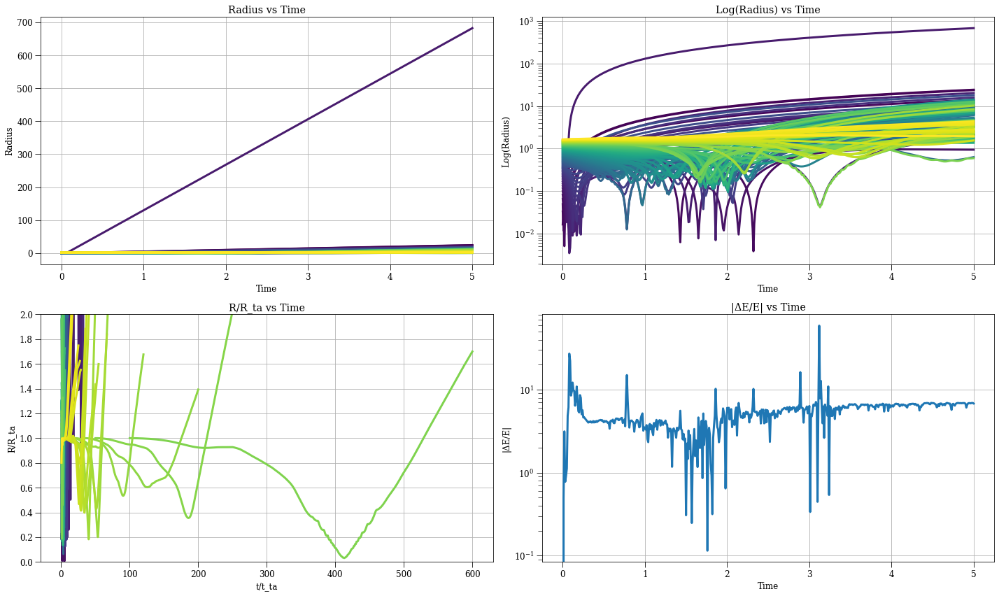

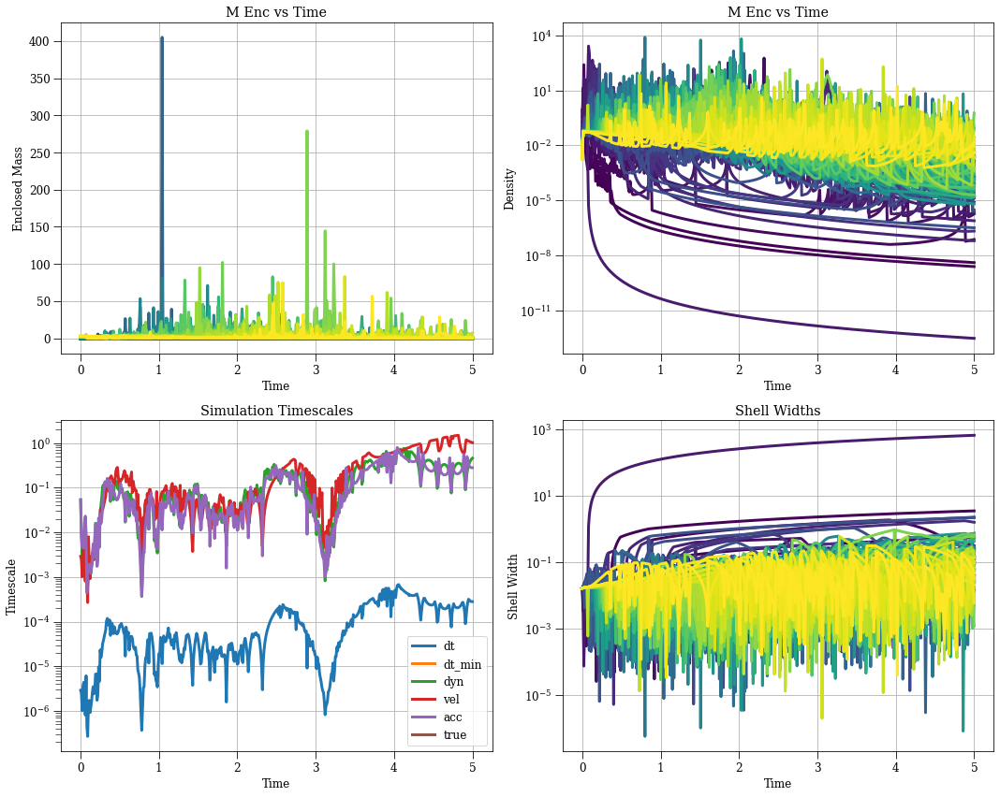

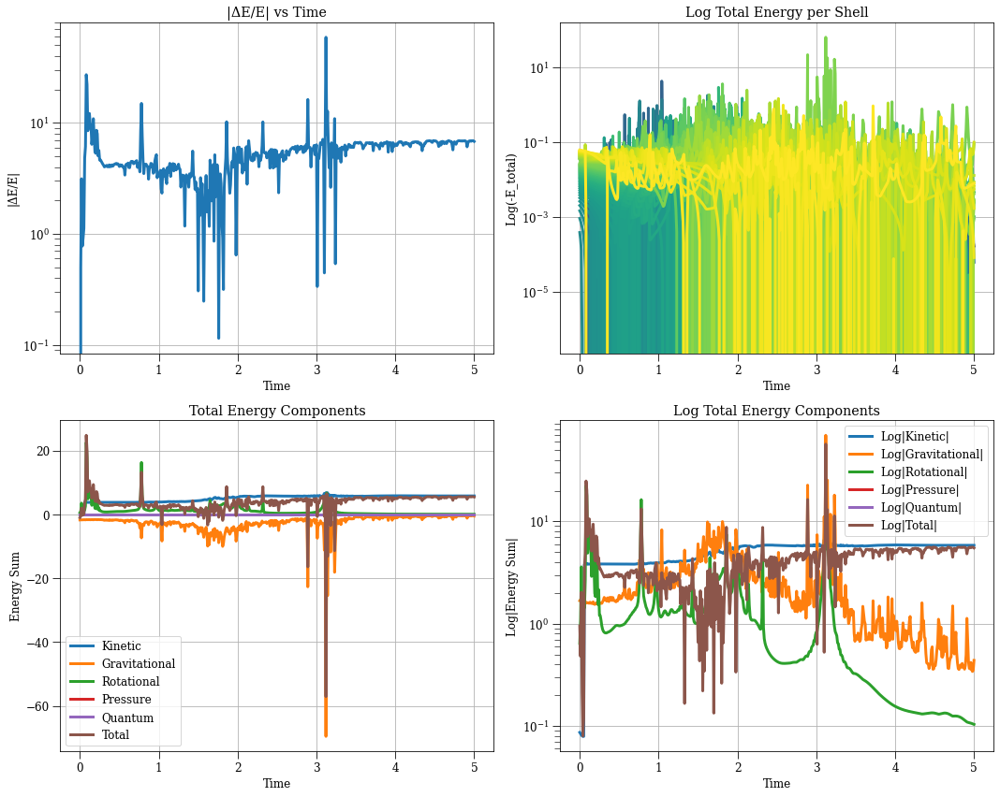

In [12]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-23-1.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 5000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00033,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.01,
 'save_dt': 0.01,
 'save_f

2025-10-22 20:52:31,312 - collapse - INFO - Simulation setup complete


2025-10-22 21:03:50,504 - DEBUG - Saved dataset t with shape (501,)
2025-10-22 21:03:50,505 - DEBUG - Saved dataset dt with shape (501,)
2025-10-22 21:03:50,543 - DEBUG - Saved dataset r with shape (501, 5000)
2025-10-22 21:03:50,567 - DEBUG - Saved dataset v with shape (501, 5000)
2025-10-22 21:03:50,590 - DEBUG - Saved dataset a with shape (501, 5000)


2025-10-22 21:03:50,622 - DEBUG - Saved dataset m_enc with shape (501, 5000)
2025-10-22 21:03:50,655 - DEBUG - Saved dataset rho_r with shape (501, 5000)
2025-10-22 21:03:50,656 - WARNING - Skipping pressure because all values are None
2025-10-22 21:03:50,657 - WARNING - Skipping dpressure_drho because all values are None
2025-10-22 21:03:50,658 - WARNING - Skipping rho_prime because all values are None
2025-10-22 21:03:50,683 - DEBUG - Saved dataset e_tot with shape (501, 5000)
2025-10-22 21:03:50,707 - DEBUG - Saved dataset e_g with shape (501, 5000)
2025-10-22 21:03:50,728 - DEBUG - Saved dataset e_k with shape (501, 5000)
2025-10-22 21:03:50,748 - DEBUG - Saved dataset e_r with shape (501, 5000)
2025-10-22 21:03:50,749 - WARNING - Skipping e_p because all values are None
2025-10-22 21:03:50,769 - DEBUG - Saved dataset e_q with shape (501, 5000)
2025-10-22 21:03:50,771 - DEBUG - Saved dataset t_dyn with shape (501,)
2025-10-22 21:03:50,772 - DEBUG - Saved dataset t_vel with shape (5

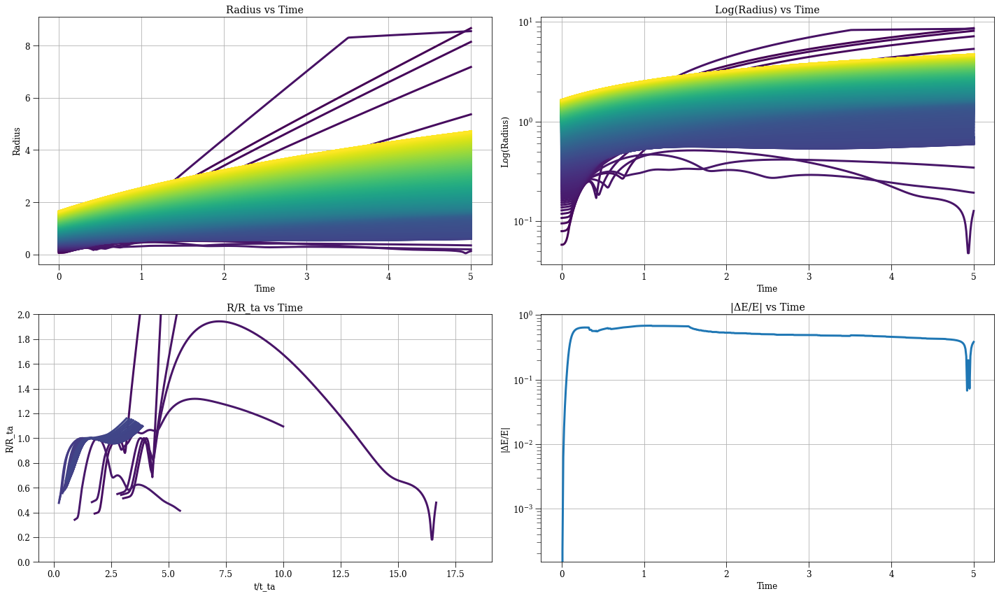

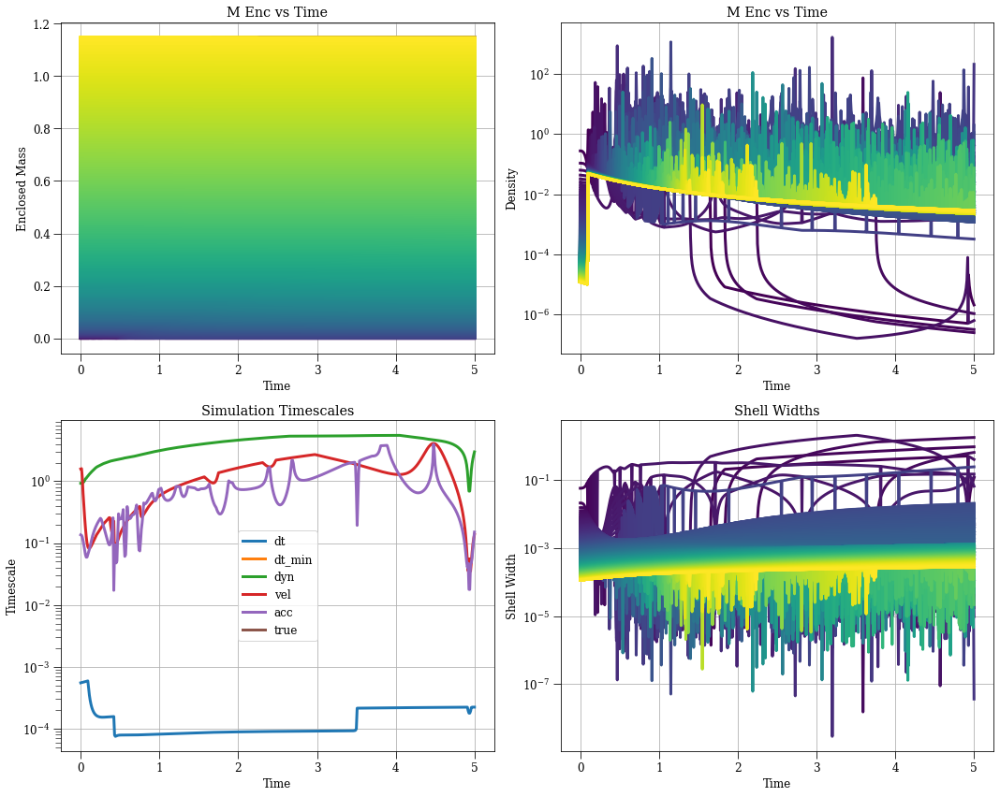

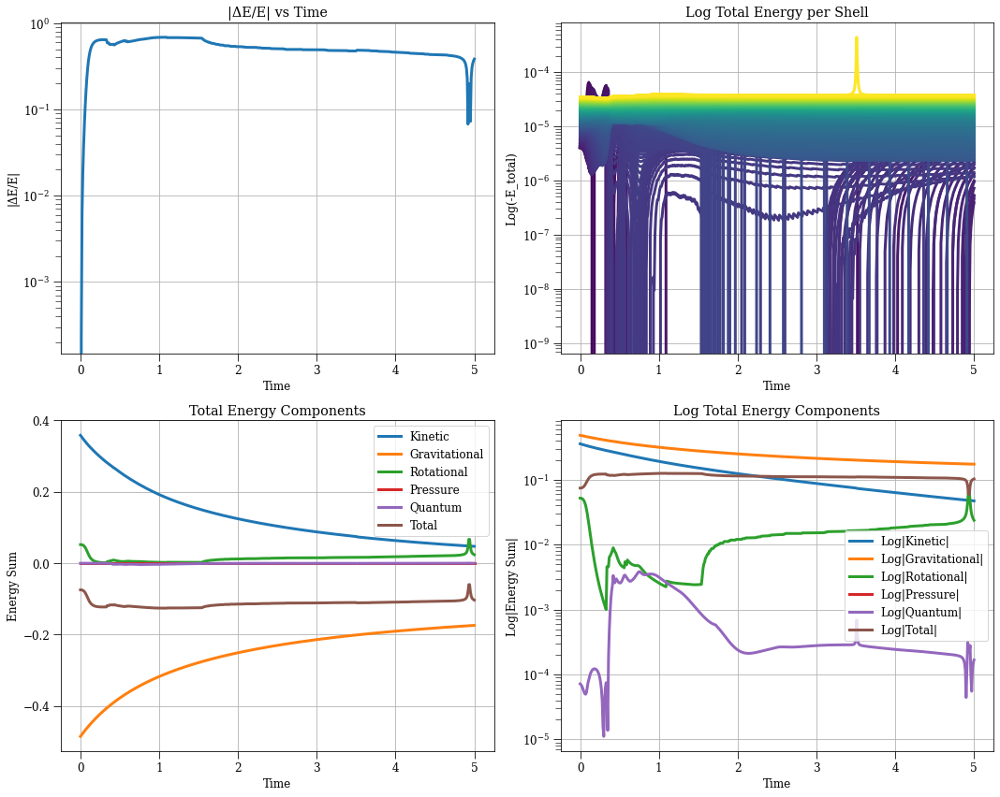

In [40]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-22-6.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 5000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00033,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.01,
 'save_dt': 0.01,
 'save_f

2025-10-22 20:49:42,435 - collapse - INFO - Simulation setup complete


2025-10-22 20:50:08,769 - DEBUG - Saved dataset t with shape (465,)
2025-10-22 20:50:08,771 - DEBUG - Saved dataset dt with shape (465,)
2025-10-22 20:50:08,795 - DEBUG - Saved dataset r with shape (465, 5000)
2025-10-22 20:50:08,816 - DEBUG - Saved dataset v with shape (465, 5000)
2025-10-22 20:50:08,843 - DEBUG - Saved dataset a with shape (465, 5000)
2025-10-22 20:50:08,869 - DEBUG - Saved dataset m_enc with shape (465, 5000)
2025-10-22 20:50:08,893 - DEBUG - Saved dataset rho_r with shape (465, 5000)
2025-10-22 20:50:08,894 - WARNING - Skipping pressure because all values are None
2025-10-22 20:50:08,894 - WARNING - Skipping dpressure_drho because all values are None
2025-10-22 20:50:08,895 - WARNING - Skipping rho_prime because all values are None
2025-10-22 20:50:08,917 - DEBUG - Saved dataset e_tot with shape (465, 5000)
2025-10-22 20:50:08,937 - DEBUG - Saved dataset e_g with shape (465, 5000)


2025-10-22 20:50:08,957 - DEBUG - Saved dataset e_k with shape (465, 5000)
2025-10-22 20:50:08,976 - DEBUG - Saved dataset e_r with shape (465, 5000)
2025-10-22 20:50:08,977 - WARNING - Skipping e_p because all values are None
2025-10-22 20:50:08,996 - DEBUG - Saved dataset e_q with shape (465, 5000)
2025-10-22 20:50:08,997 - DEBUG - Saved dataset t_dyn with shape (465,)
2025-10-22 20:50:08,998 - DEBUG - Saved dataset t_vel with shape (465,)
2025-10-22 20:50:09,000 - DEBUG - Saved dataset t_acc with shape (465,)
2025-10-22 20:50:09,000 - WARNING - Skipping t_cross because all values are None
2025-10-22 20:50:09,002 - WARNING - Skipping t_crossa because all values are None
2025-10-22 20:50:09,003 - WARNING - Skipping t_cross2 because all values are None
2025-10-22 20:50:09,003 - WARNING - Skipping t_zero because all values are None
2025-10-22 20:50:09,004 - WARNING - Skipping t_rmin because all values are None
2025-10-22 20:50:09,005 - WARNING - Skipping t_rmina because all values are N

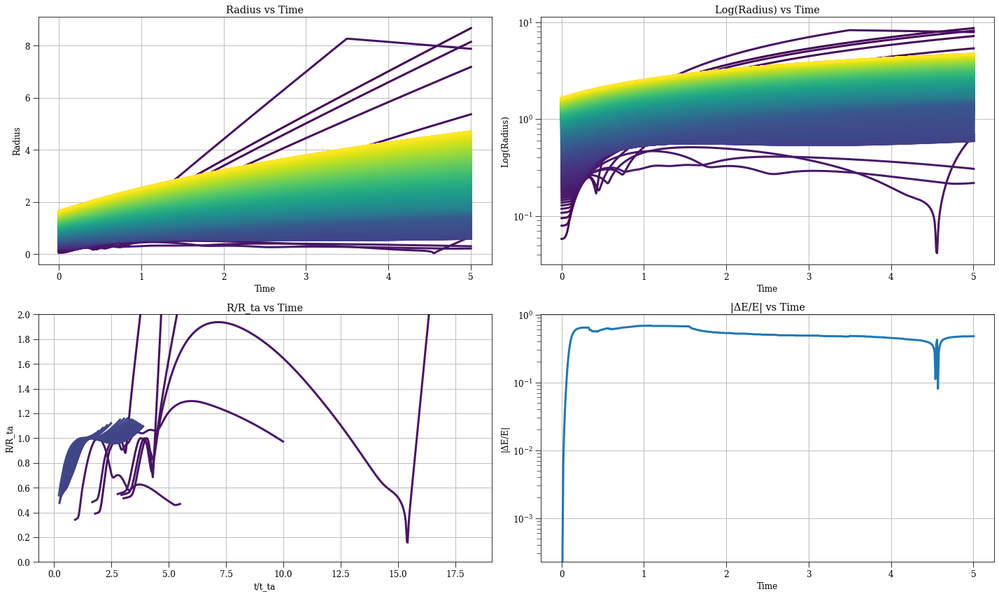

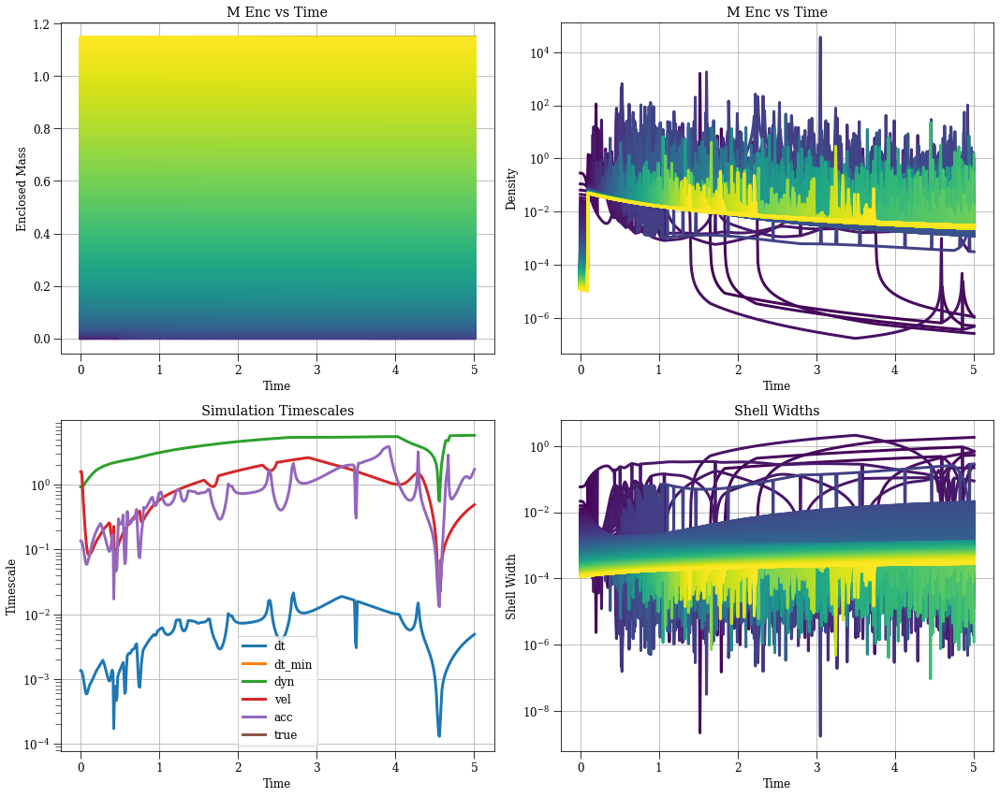

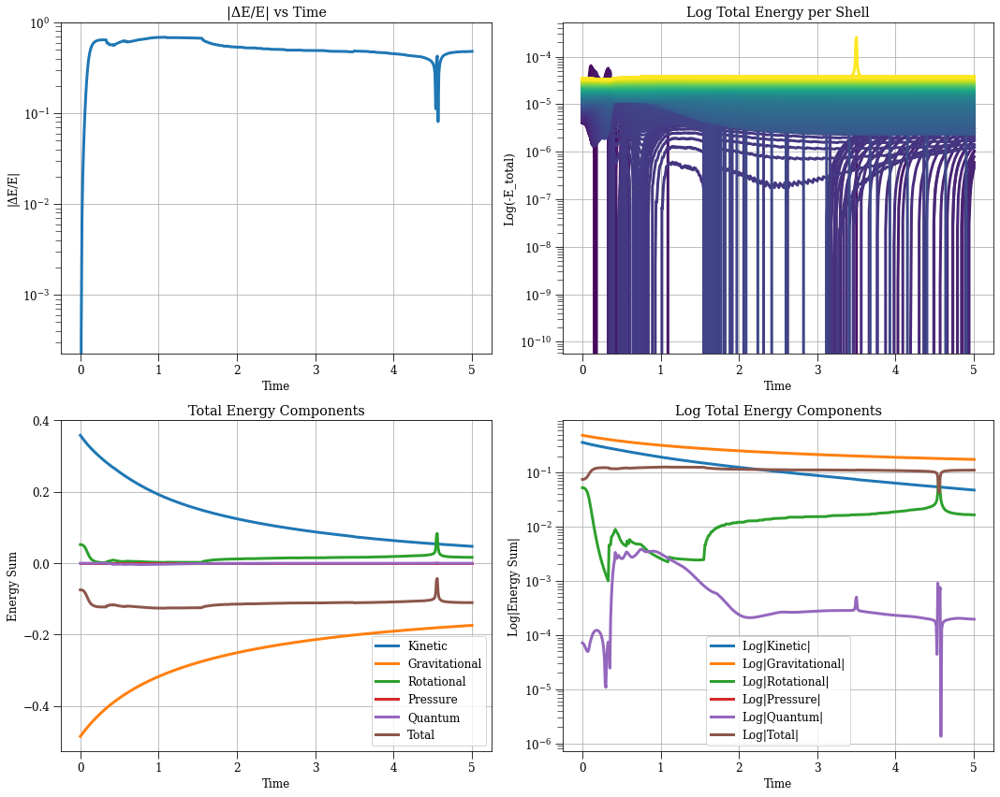

In [38]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-22-6.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_

2025-10-22 19:51:49,042 - collapse - INFO - Simulation setup complete


2025-10-22 20:00:08,811 - DEBUG - Saved dataset t with shape (501,)
2025-10-22 20:00:08,813 - DEBUG - Saved dataset dt with shape (501,)
2025-10-22 20:00:08,828 - DEBUG - Saved dataset r with shape (501, 1000)
2025-10-22 20:00:08,836 - DEBUG - Saved dataset v with shape (501, 1000)
2025-10-22 20:00:08,843 - DEBUG - Saved dataset a with shape (501, 1000)
2025-10-22 20:00:08,851 - DEBUG - Saved dataset m_enc with shape (501, 1000)
2025-10-22 20:00:08,858 - DEBUG - Saved dataset rho_r with shape (501, 1000)
2025-10-22 20:00:08,859 - WARNING - Skipping pressure because all values are None
2025-10-22 20:00:08,859 - WARNING - Skipping dpressure_drho because all values are None
2025-10-22 20:00:08,860 - WARNING - Skipping rho_prime because all values are None
2025-10-22 20:00:08,867 - DEBUG - Saved dataset e_tot with shape (501, 1000)
2025-10-22 20:00:08,873 - DEBUG - Saved dataset e_g with shape (501, 1000)
2025-10-22 20:00:08,880 - DEBUG - Saved dataset e_k with shape (501, 1000)
2025-10-22

2025-10-22 20:00:09,028 - INFO - Saved simulation data and parameters to 10-22-5.h5


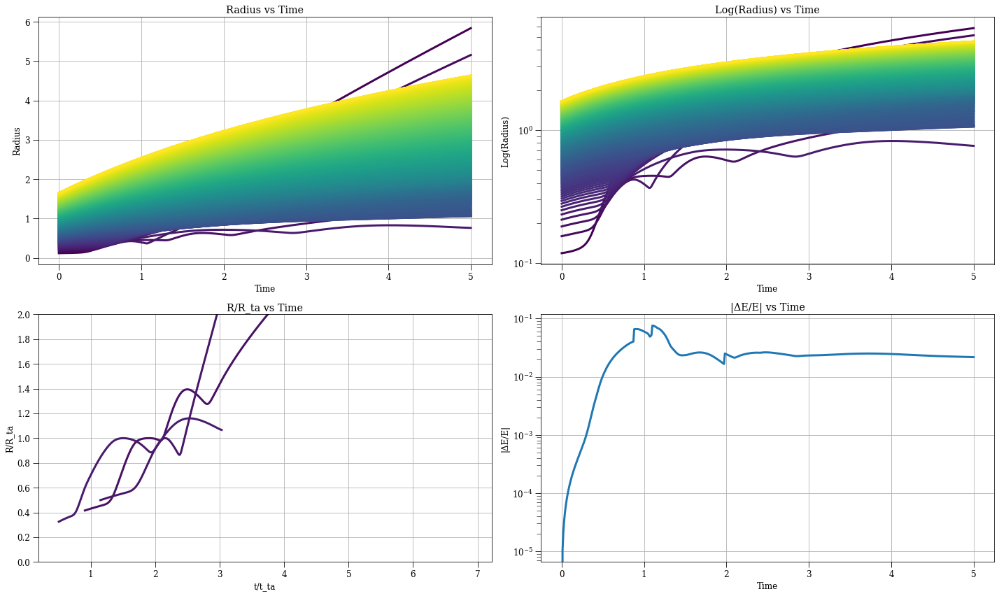

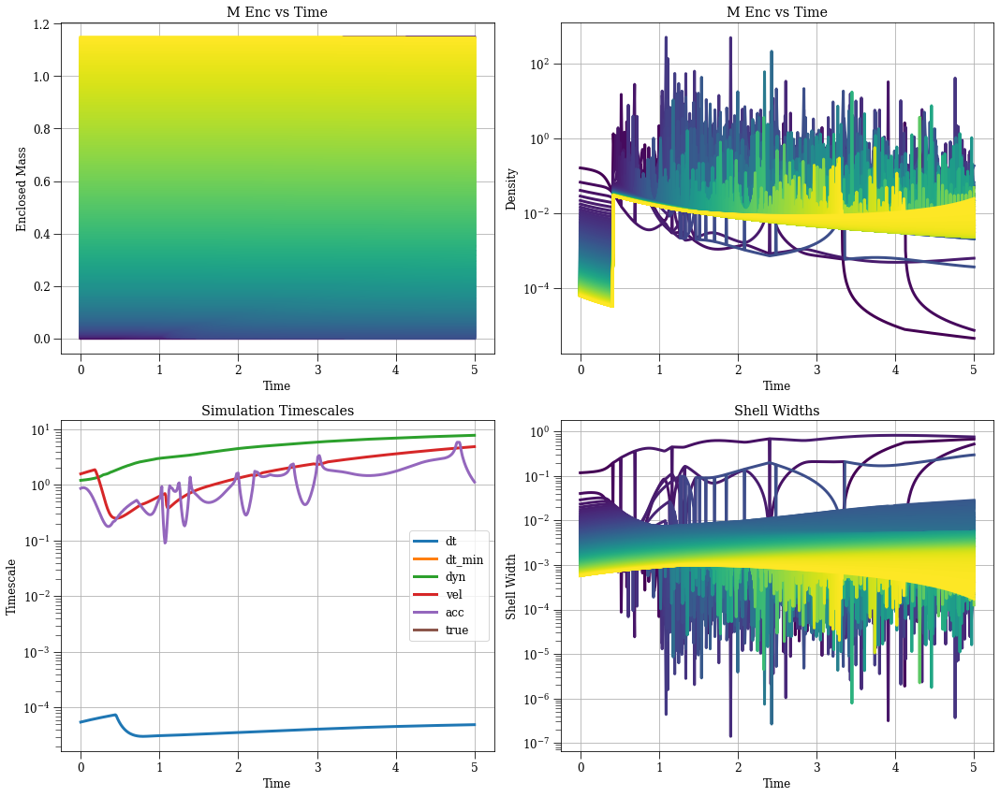

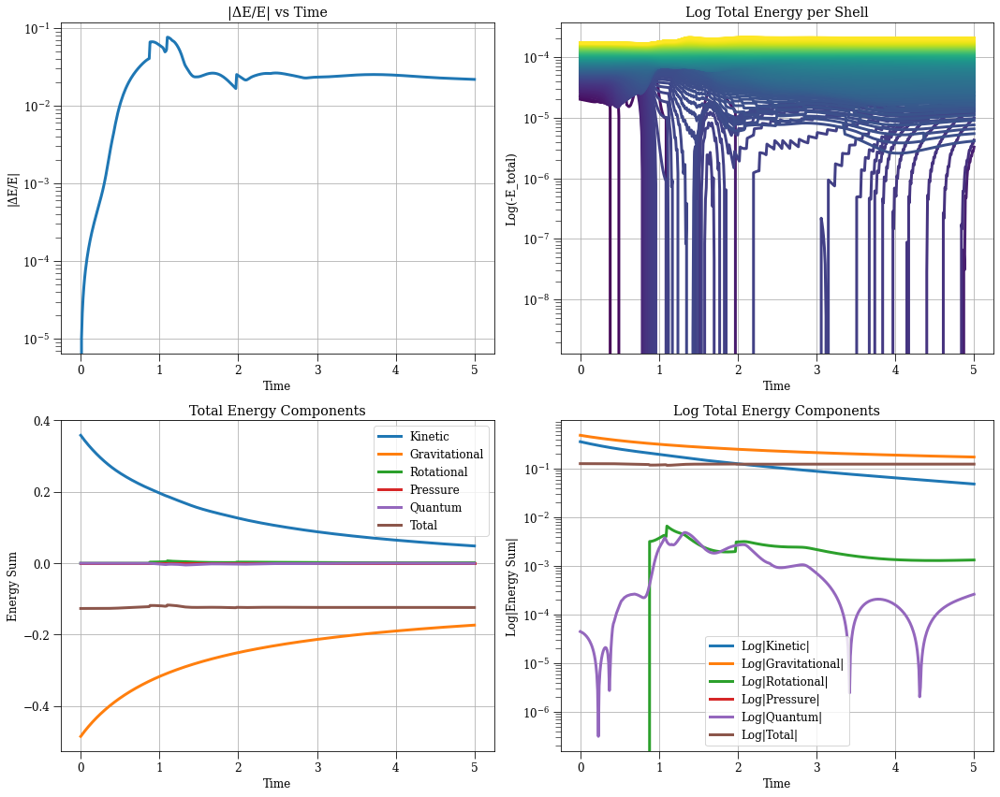

In [30]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-22-5.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'neighbor2',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_

2025-10-22 19:41:11,439 - collapse - INFO - Simulation setup complete


2025-10-22 19:48:15,515 - DEBUG - Saved dataset t with shape (501,)
2025-10-22 19:48:15,517 - DEBUG - Saved dataset dt with shape (501,)
2025-10-22 19:48:15,527 - DEBUG - Saved dataset r with shape (501, 1000)
2025-10-22 19:48:15,536 - DEBUG - Saved dataset v with shape (501, 1000)
2025-10-22 19:48:15,543 - DEBUG - Saved dataset a with shape (501, 1000)
2025-10-22 19:48:15,551 - DEBUG - Saved dataset m_enc with shape (501, 1000)
2025-10-22 19:48:15,558 - DEBUG - Saved dataset rho_r with shape (501, 1000)
2025-10-22 19:48:15,558 - WARNING - Skipping pressure because all values are None
2025-10-22 19:48:15,559 - WARNING - Skipping dpressure_drho because all values are None
2025-10-22 19:48:15,560 - WARNING - Skipping rho_prime because all values are None
2025-10-22 19:48:15,570 - DEBUG - Saved dataset e_tot with shape (501, 1000)
2025-10-22 19:48:15,576 - DEBUG - Saved dataset e_g with shape (501, 1000)
2025-10-22 19:48:15,583 - DEBUG - Saved dataset e_k with shape (501, 1000)
2025-10-22

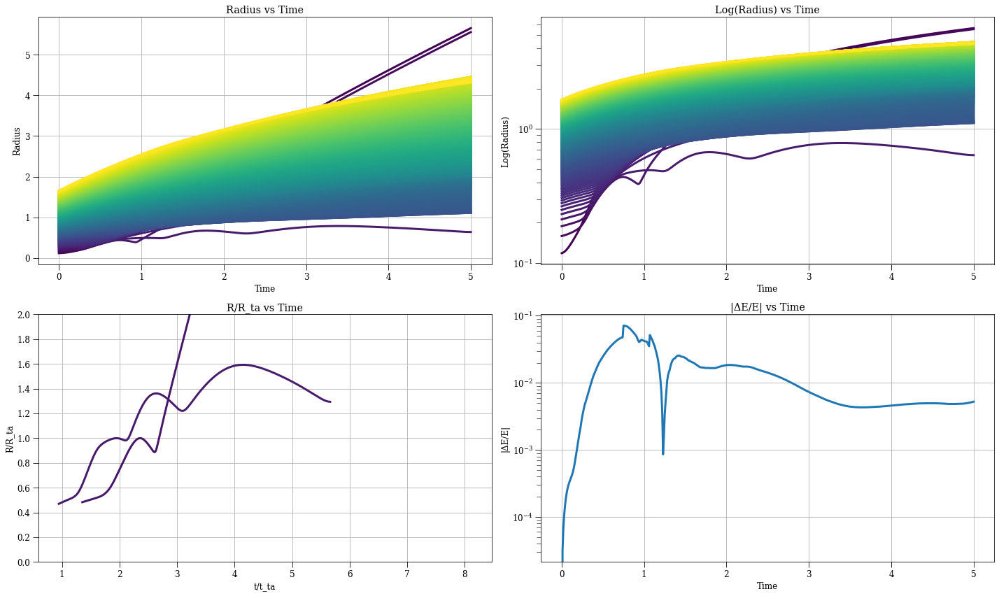

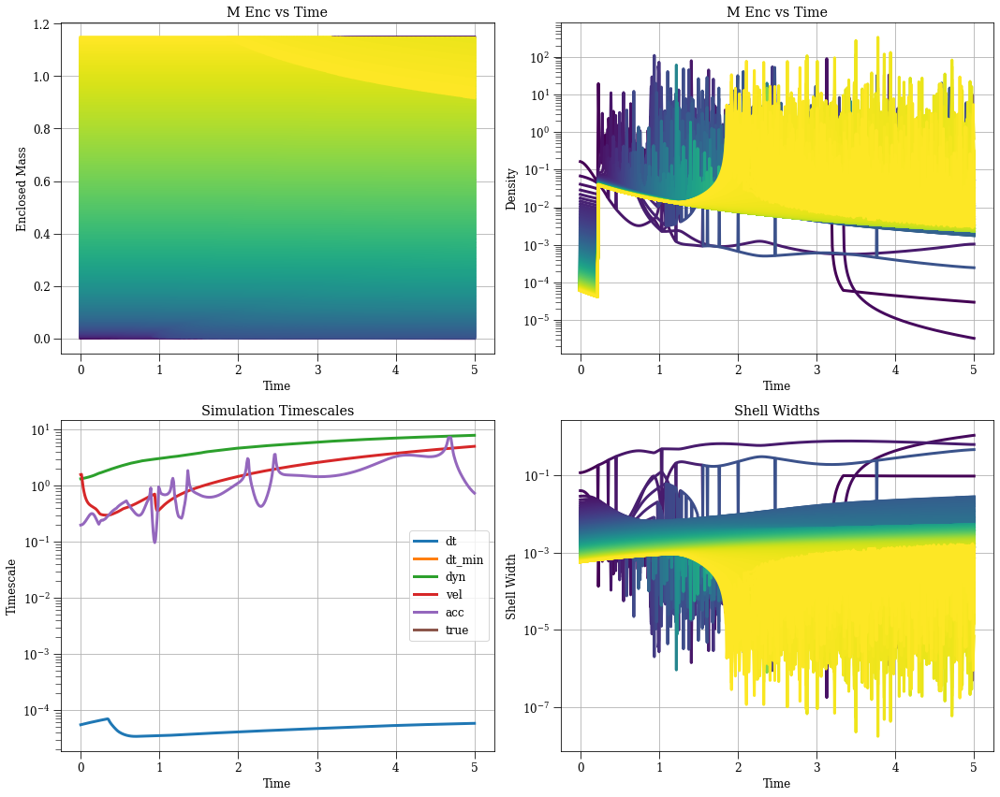

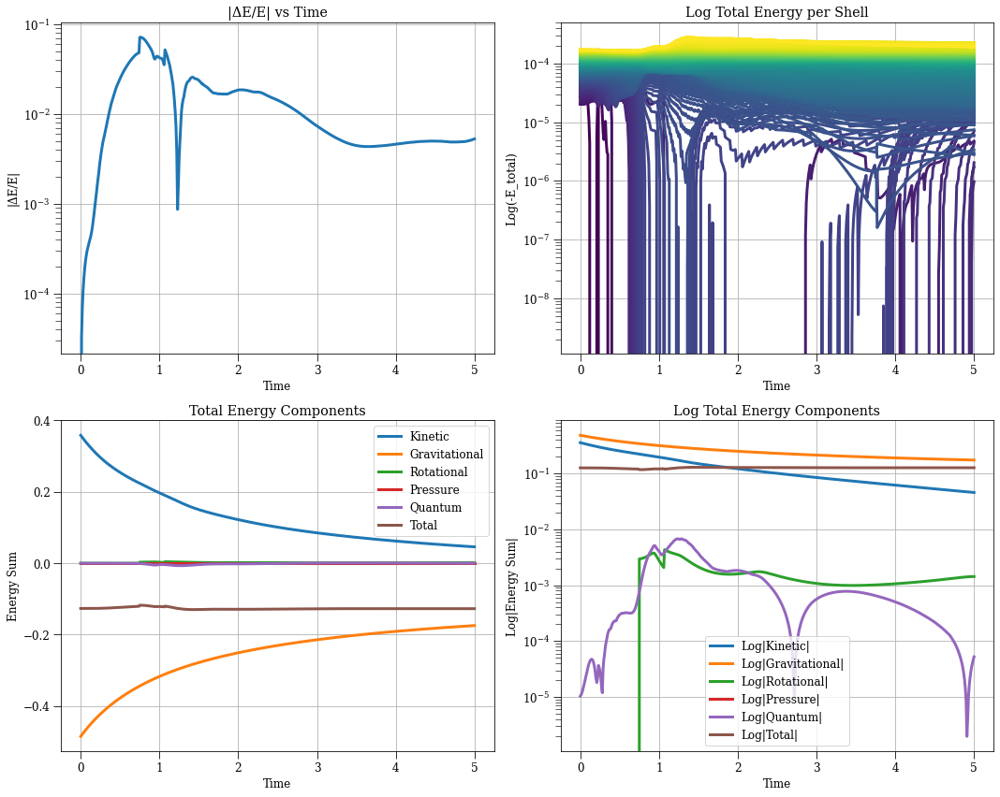

In [28]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-22-4.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'neighbor2',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_filen

2025-10-22 19:36:22,002 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:1459: RuntimeWarning: invalid value encountered in log
  rho_sorted = sim.rho_r[sorted_indices]
2025-10-22 19:39:03,626 - DEBUG - Saved dataset t with shape (5001,)
2025-10-22 19:39:03,628 - DEBUG - Saved dataset dt with shape (5001,)
2025-10-22 19:39:03,697 - DEBUG - Saved dataset r with shape (5001, 1000)
2025-10-22 19:39:03,759 - DEBUG - Saved dataset v with shape (5001, 1000)


2025-10-22 19:39:03,823 - DEBUG - Saved dataset a with shape (5001, 1000)
2025-10-22 19:39:03,886 - DEBUG - Saved dataset m_enc with shape (5001, 1000)
2025-10-22 19:39:03,948 - DEBUG - Saved dataset rho_r with shape (5001, 1000)
2025-10-22 19:39:03,949 - WARNING - Skipping pressure because all values are None
2025-10-22 19:39:03,950 - WARNING - Skipping dpressure_drho because all values are None
2025-10-22 19:39:03,951 - WARNING - Skipping rho_prime because all values are None
2025-10-22 19:39:04,013 - DEBUG - Saved dataset e_tot with shape (5001, 1000)
2025-10-22 19:39:04,075 - DEBUG - Saved dataset e_g with shape (5001, 1000)
2025-10-22 19:39:04,133 - DEBUG - Saved dataset e_k with shape (5001, 1000)
2025-10-22 19:39:04,197 - DEBUG - Saved dataset e_r with shape (5001, 1000)
2025-10-22 19:39:04,198 - WARNING - Skipping e_p because all values are None
2025-10-22 19:39:04,261 - DEBUG - Saved dataset e_q with shape (5001, 1000)
2025-10-22 19:39:04,262 - DEBUG - Saved dataset t_dyn with

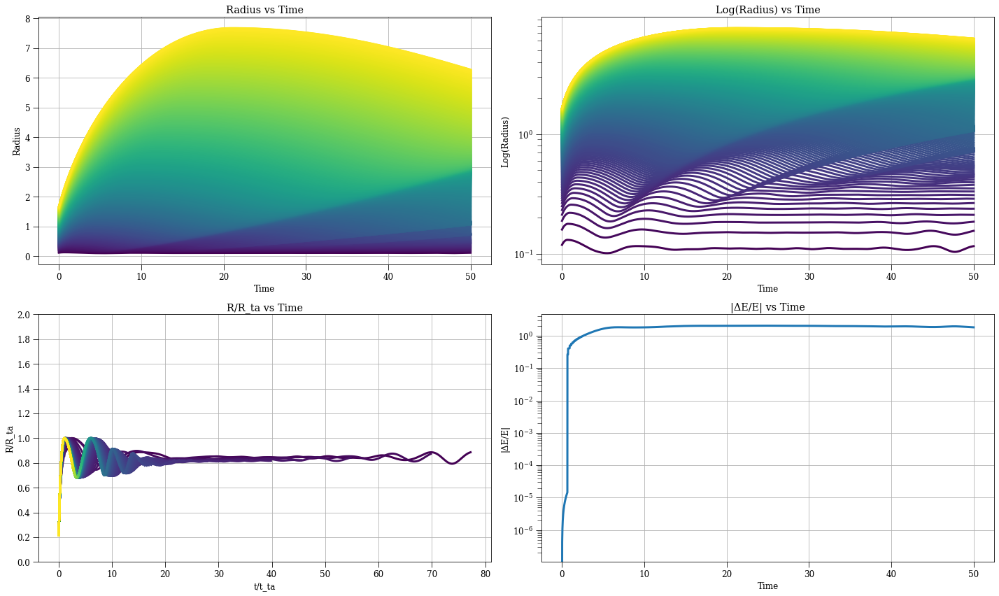

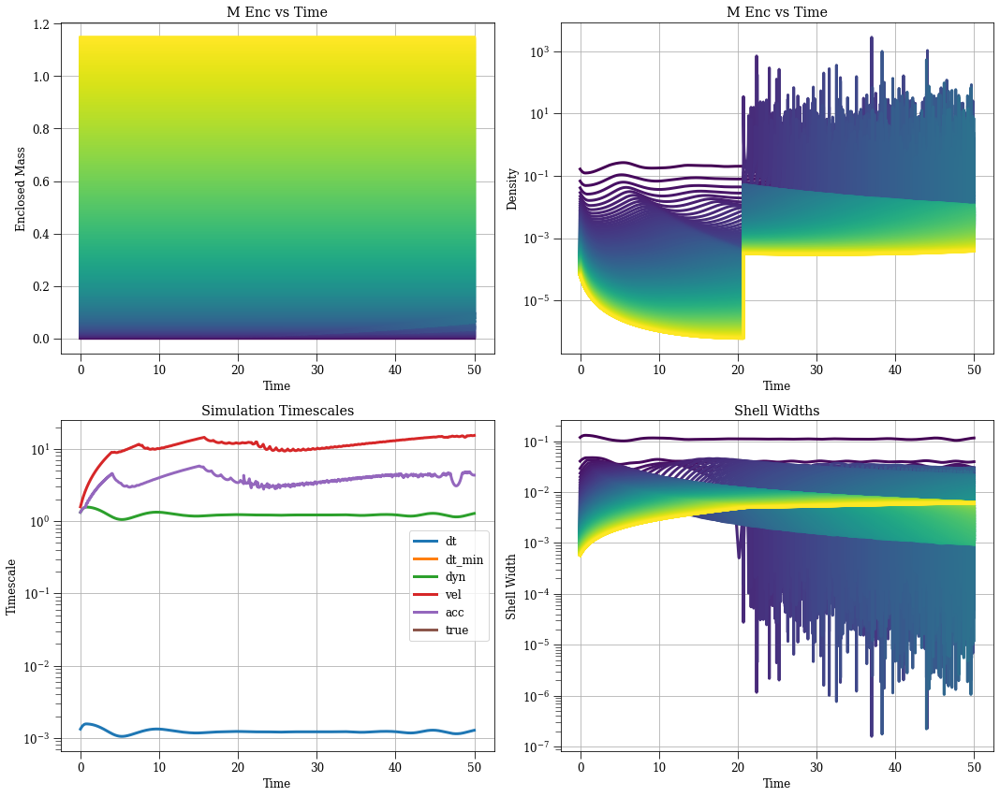

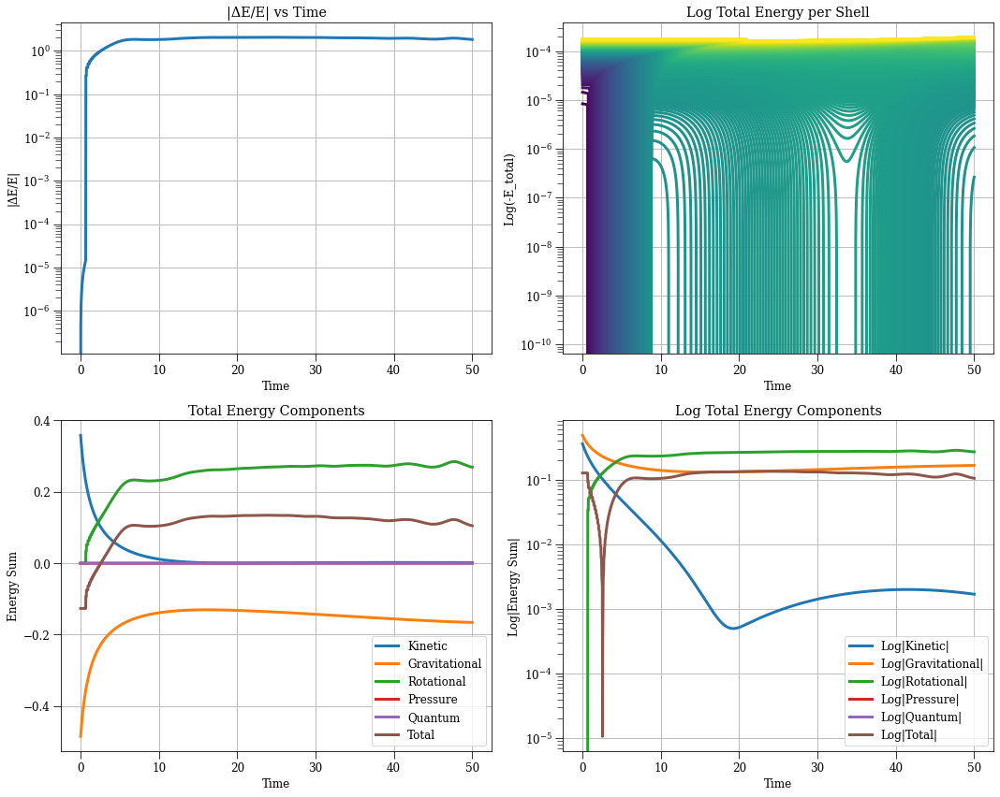

In [26]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-22-3.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 1.0000000000000002e-10,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt

2025-10-22 19:31:21,201 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:1459: RuntimeWarning: invalid value encountered in log
  rho_sorted = sim.rho_r[sorted_indices]
2025-10-22 19:35:48,571 - DEBUG - Saved dataset t with shape (5001,)
2025-10-22 19:35:48,573 - DEBUG - Saved dataset dt with shape (5001,)
2025-10-22 19:35:48,652 - DEBUG - Saved dataset r with shape (5001, 1000)


2025-10-22 19:35:48,715 - DEBUG - Saved dataset v with shape (5001, 1000)
2025-10-22 19:35:48,781 - DEBUG - Saved dataset a with shape (5001, 1000)
2025-10-22 19:35:48,843 - DEBUG - Saved dataset m_enc with shape (5001, 1000)
2025-10-22 19:35:48,902 - DEBUG - Saved dataset rho_r with shape (5001, 1000)
2025-10-22 19:35:48,903 - WARNING - Skipping pressure because all values are None
2025-10-22 19:35:48,904 - WARNING - Skipping dpressure_drho because all values are None
2025-10-22 19:35:48,905 - WARNING - Skipping rho_prime because all values are None
2025-10-22 19:35:48,970 - DEBUG - Saved dataset e_tot with shape (5001, 1000)
2025-10-22 19:35:49,035 - DEBUG - Saved dataset e_g with shape (5001, 1000)
2025-10-22 19:35:49,097 - DEBUG - Saved dataset e_k with shape (5001, 1000)
2025-10-22 19:35:49,164 - DEBUG - Saved dataset e_r with shape (5001, 1000)
2025-10-22 19:35:49,165 - WARNING - Skipping e_p because all values are None
2025-10-22 19:35:49,229 - DEBUG - Saved dataset e_q with sha

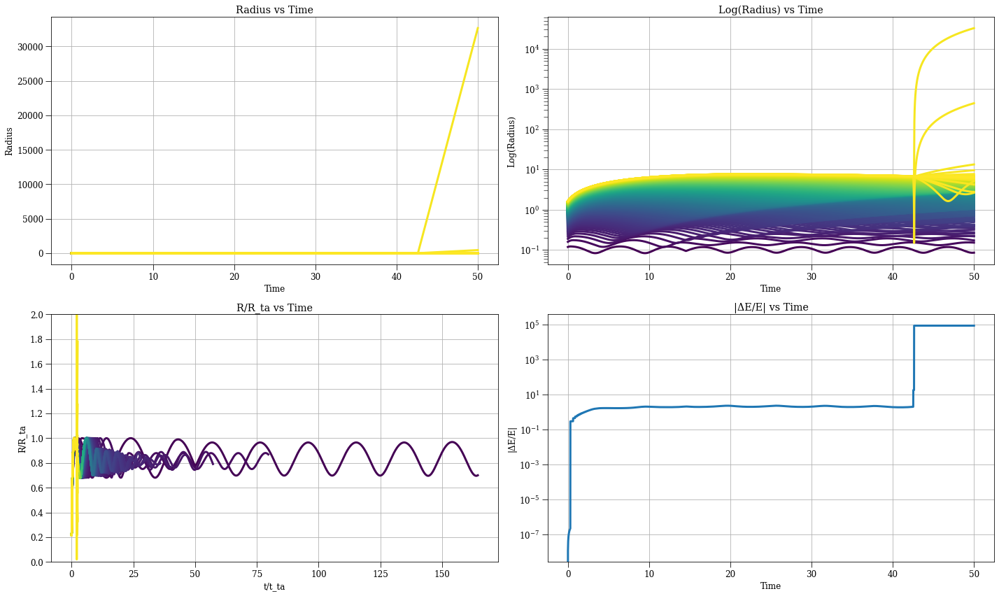

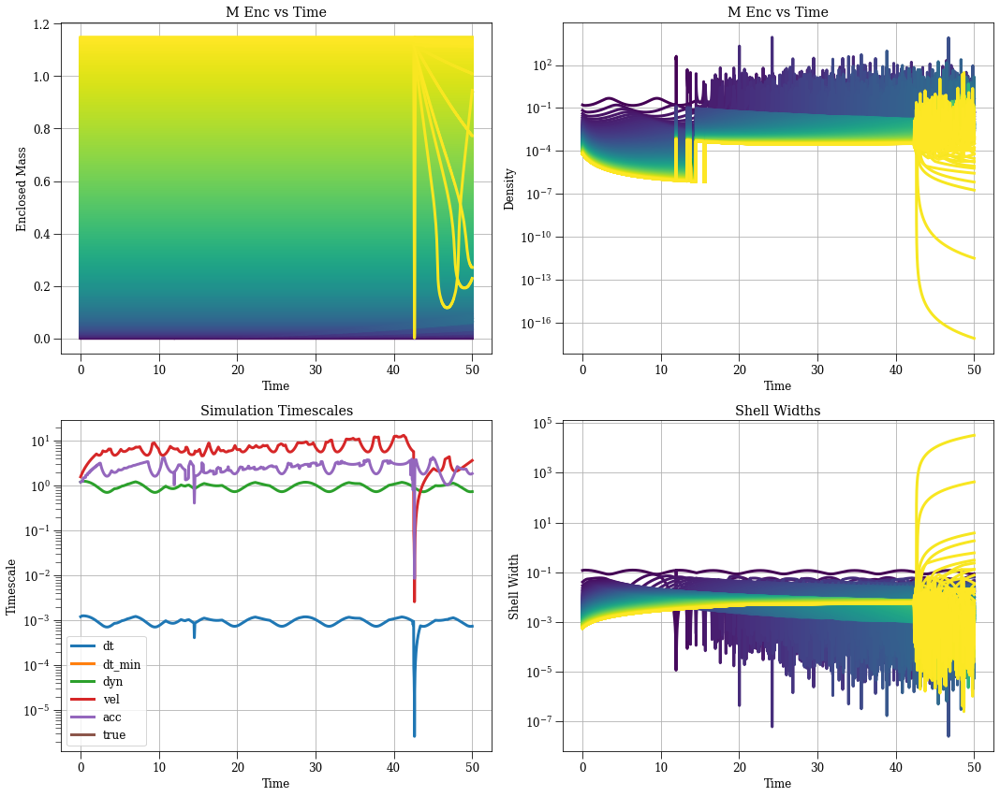

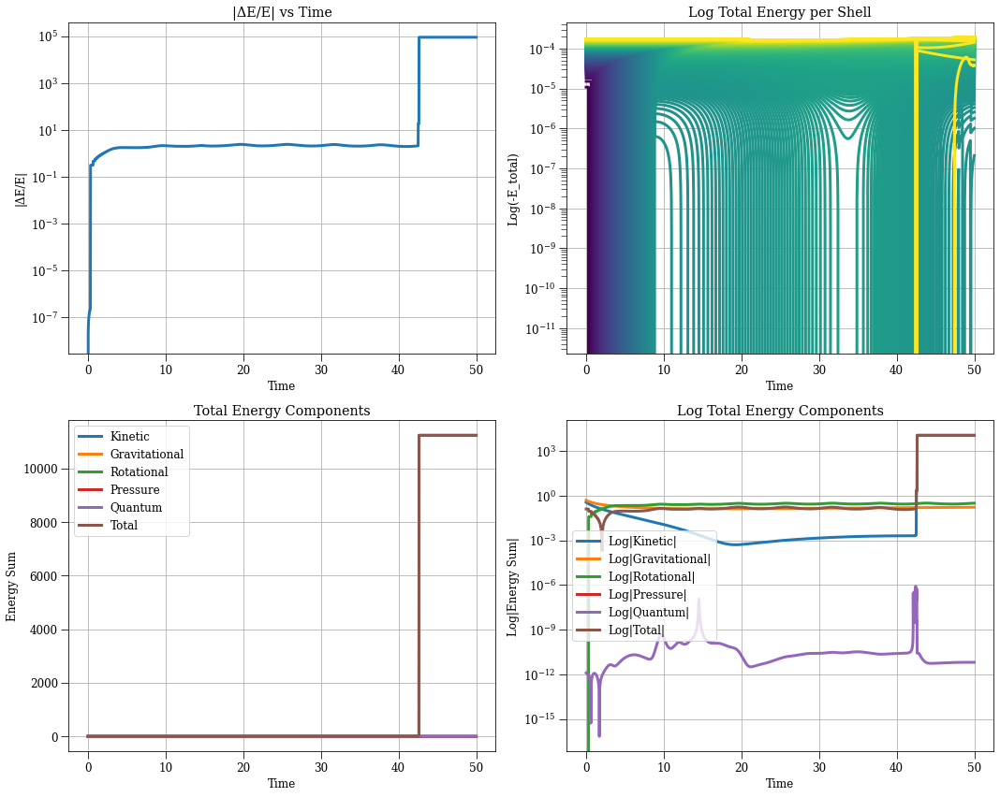

In [24]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-22-2.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 1.0000000000000002e-10,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'neighbor',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt'

2025-10-22 19:28:07,603 - collapse - INFO - Simulation setup complete


/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/simulation_strategies.py:1459: RuntimeWarning: invalid value encountered in log
  rho_sorted = sim.rho_r[sorted_indices]
2025-10-22 19:30:00,913 - DEBUG - Saved dataset t with shape (5001,)
2025-10-22 19:30:00,915 - DEBUG - Saved dataset dt with shape (5001,)
2025-10-22 19:30:00,983 - DEBUG - Saved dataset r with shape (5001, 1000)


2025-10-22 19:30:01,049 - DEBUG - Saved dataset v with shape (5001, 1000)
2025-10-22 19:30:01,118 - DEBUG - Saved dataset a with shape (5001, 1000)
2025-10-22 19:30:01,186 - DEBUG - Saved dataset m_enc with shape (5001, 1000)
2025-10-22 19:30:01,254 - DEBUG - Saved dataset rho_r with shape (5001, 1000)
2025-10-22 19:30:01,255 - WARNING - Skipping pressure because all values are None
2025-10-22 19:30:01,256 - WARNING - Skipping dpressure_drho because all values are None
2025-10-22 19:30:01,257 - WARNING - Skipping rho_prime because all values are None
2025-10-22 19:30:01,324 - DEBUG - Saved dataset e_tot with shape (5001, 1000)
2025-10-22 19:30:01,387 - DEBUG - Saved dataset e_g with shape (5001, 1000)
2025-10-22 19:30:01,447 - DEBUG - Saved dataset e_k with shape (5001, 1000)
2025-10-22 19:30:01,509 - DEBUG - Saved dataset e_r with shape (5001, 1000)
2025-10-22 19:30:01,510 - WARNING - Skipping e_p because all values are None
2025-10-22 19:30:01,568 - DEBUG - Saved dataset e_q with sha

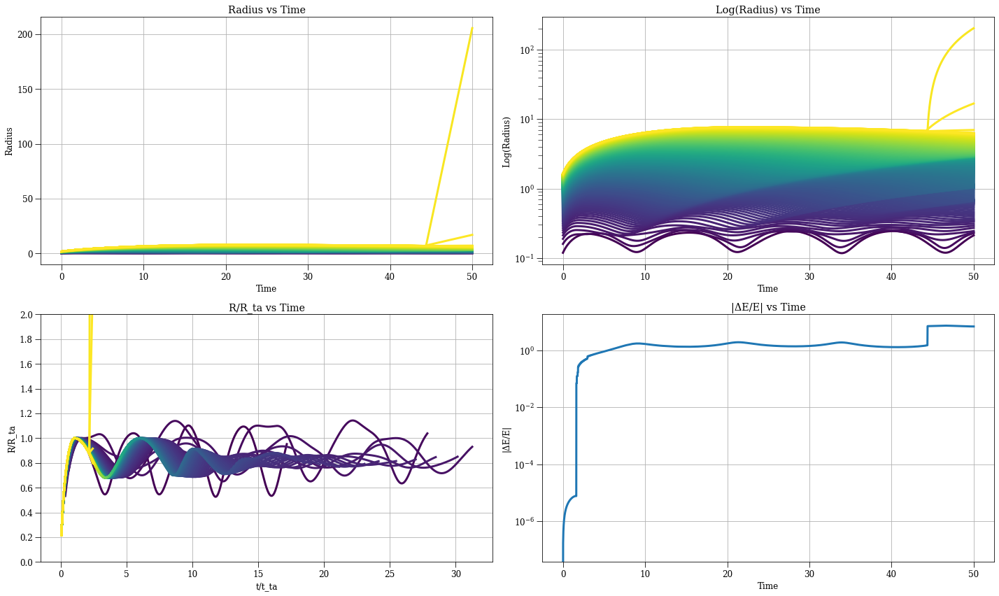

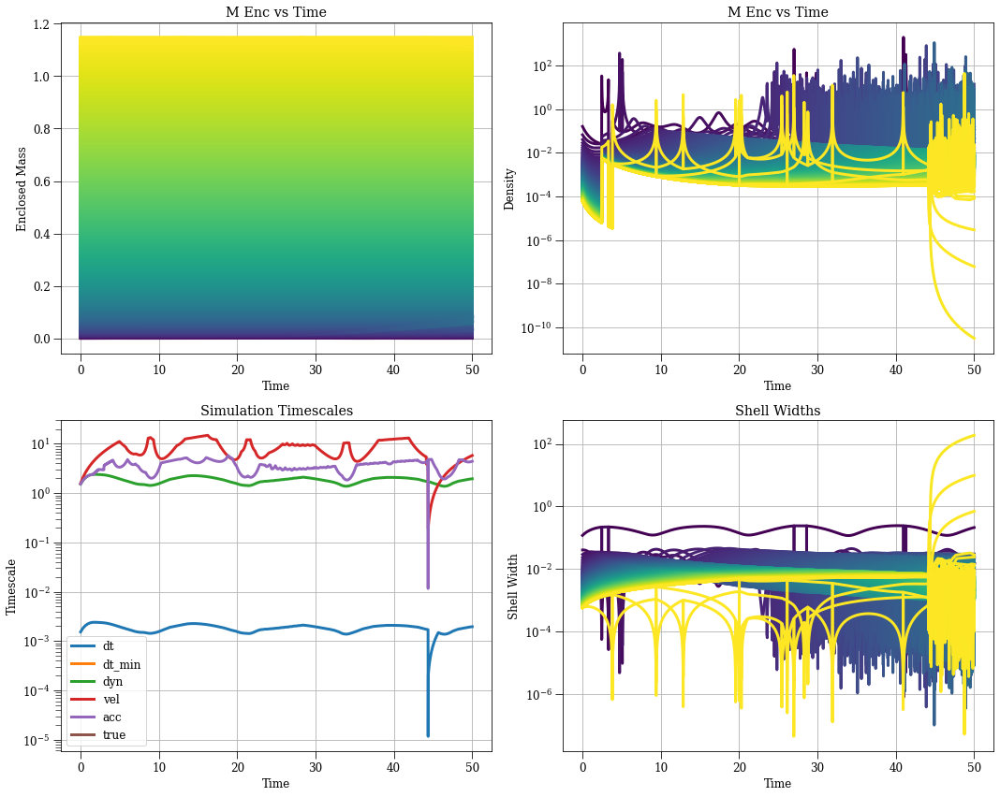

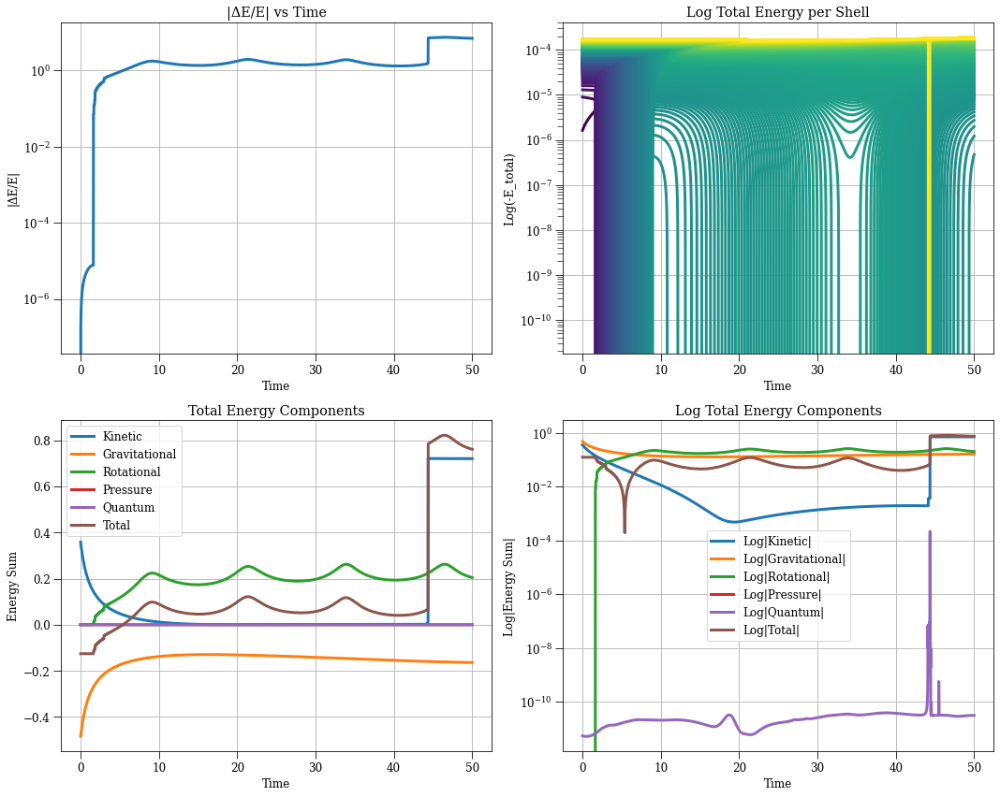

In [22]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-22-1.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

In [43]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-16-1.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 10000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.5,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.000165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.01,
 'save_dt': 0.01,
 'save

2025-10-17 03:19:32,708 - collapse - INFO - Simulation setup complete


KeyboardInterrupt: 

In [52]:
r_max = 1.65
j_coef = 9e-1
N = 1000
t_max = 30
safety_factor = 1e-3
save_dt = 1e-2
delta = 0.15
irs = 'equal_mass'#'r0min_start_equal'
ivs = 'peculiar'
density_strategy = 'background_plus_power_law_total'
accel_strategy, ang_mom_strategy = 'grant_gmr_j_at_r_ta_fdm3', 'gmr' #grant_gmr_j_at_r_ta_soft'
energy_strategy = 'kin_grav_rot_fdm_absorbed'
softlen = 0
hbar2_over_m2 = (6e-2)**2
problematic_shell_strategy = 'nothing'

tss = 'dyn_vel_acc'
mes = 'inclusive'
save_strategy = 'default'
r_min = 0
gamma = -1
thickness_coef = 0

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_

2025-10-17 03:33:37,341 - collapse - INFO - Simulation setup complete


2025-10-17 03:35:00,710 - DEBUG - Saved dataset t with shape (3001,)
2025-10-17 03:35:00,712 - DEBUG - Saved dataset dt with shape (3001,)
2025-10-17 03:35:00,752 - DEBUG - Saved dataset r with shape (3001, 1000)
2025-10-17 03:35:00,772 - DEBUG - Saved dataset v with shape (3001, 1000)
2025-10-17 03:35:00,793 - DEBUG - Saved dataset a with shape (3001, 1000)
2025-10-17 03:35:00,813 - DEBUG - Saved dataset m_enc with shape (3001, 1000)
2025-10-17 03:35:00,833 - DEBUG - Saved dataset rho_r with shape (3001, 1000)
2025-10-17 03:35:00,834 - WARNING - Skipping pressure because all values are None
2025-10-17 03:35:00,834 - WARNING - Skipping dpressure_drho because all values are None
2025-10-17 03:35:00,835 - WARNING - Skipping rho_prime because all values are None
2025-10-17 03:35:00,854 - DEBUG - Saved dataset e_tot with shape (3001, 1000)


2025-10-17 03:35:00,875 - DEBUG - Saved dataset e_g with shape (3001, 1000)
2025-10-17 03:35:00,894 - DEBUG - Saved dataset e_k with shape (3001, 1000)
2025-10-17 03:35:00,913 - DEBUG - Saved dataset e_r with shape (3001, 1000)
2025-10-17 03:35:00,914 - WARNING - Skipping e_p because all values are None
2025-10-17 03:35:00,935 - DEBUG - Saved dataset e_q with shape (3001, 1000)
2025-10-17 03:35:00,937 - DEBUG - Saved dataset t_dyn with shape (3001,)
2025-10-17 03:35:00,939 - DEBUG - Saved dataset t_vel with shape (3001,)
2025-10-17 03:35:00,940 - DEBUG - Saved dataset t_acc with shape (3001,)
2025-10-17 03:35:00,941 - WARNING - Skipping t_cross because all values are None
2025-10-17 03:35:00,942 - WARNING - Skipping t_crossa because all values are None
2025-10-17 03:35:00,942 - WARNING - Skipping t_cross2 because all values are None
2025-10-17 03:35:00,943 - WARNING - Skipping t_zero because all values are None
2025-10-17 03:35:00,944 - WARNING - Skipping t_rmin because all values are 

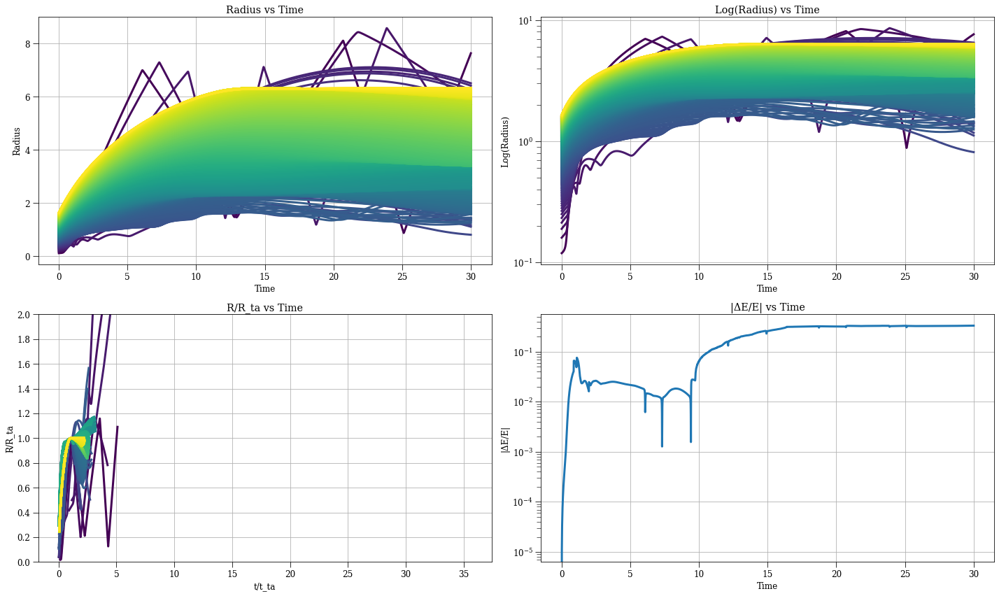

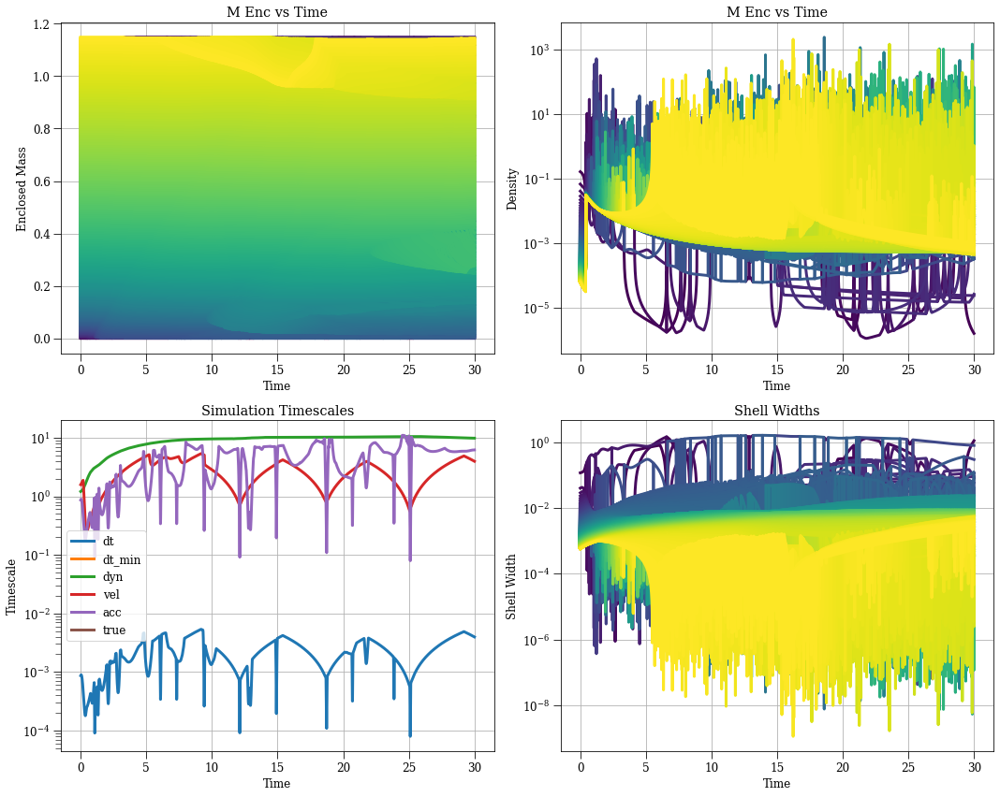

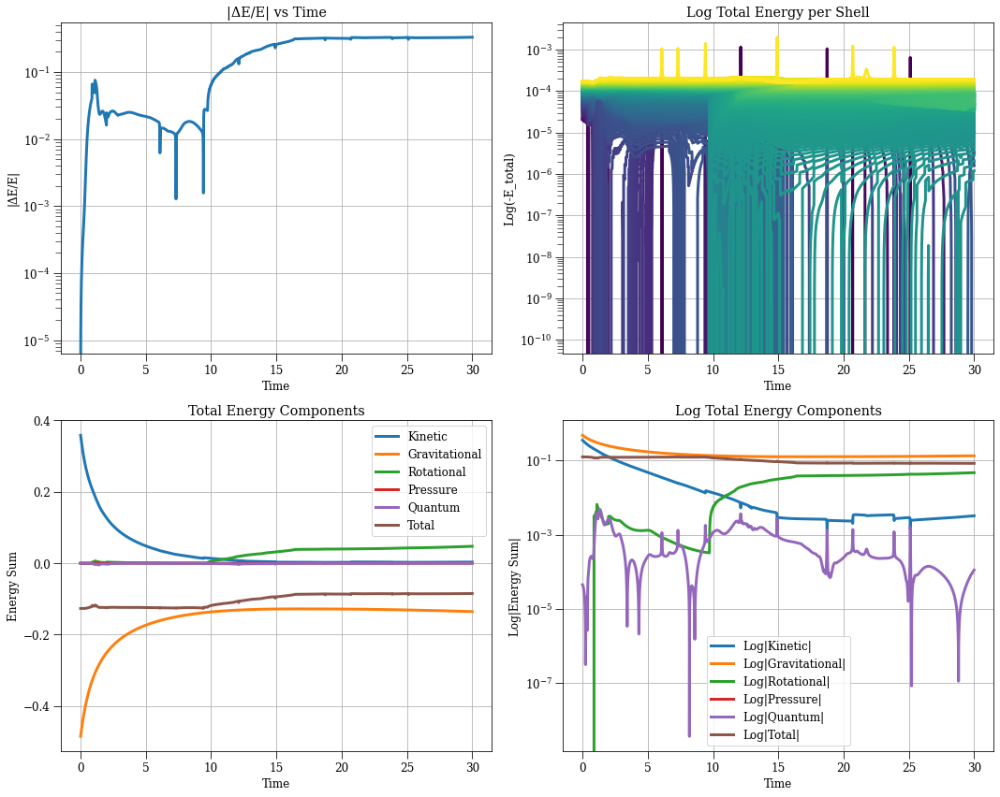

In [53]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-16-2.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

In [54]:
r_max = 1.65
j_coef = 9e-1
N = 1000
t_max = 30
safety_factor = 1e-3
save_dt = 1e-2
delta = 0.15
irs = 'equal_mass'#'r0min_start_equal'
ivs = 'peculiar'
density_strategy = 'background_plus_power_law_total'
accel_strategy, ang_mom_strategy = 'grant_gmr_j_at_r_ta_fdm3', 'gmr' #grant_gmr_j_at_r_ta_soft'
energy_strategy = 'kin_grav_rot_fdm_absorbed'
softlen = 0
hbar2_over_m2 = (6e-2)**2
problematic_shell_strategy = 'nothing'

tss = 'dyn_vel_acc_dbvel'
mes = 'inclusive'
save_strategy = 'default'
r_min = 0
gamma = -1
thickness_coef = 0

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_

2025-10-17 03:36:06,784 - collapse - INFO - Simulation setup complete


2025-10-17 04:40:19,290 - DEBUG - Saved dataset t with shape (3001,)
2025-10-17 04:40:19,292 - DEBUG - Saved dataset dt with shape (3001,)
2025-10-17 04:40:19,330 - DEBUG - Saved dataset r with shape (3001, 1000)
2025-10-17 04:40:19,360 - DEBUG - Saved dataset v with shape (3001, 1000)
2025-10-17 04:40:19,386 - DEBUG - Saved dataset a with shape (3001, 1000)
2025-10-17 04:40:19,407 - DEBUG - Saved dataset m_enc with shape (3001, 1000)


2025-10-17 04:40:19,430 - DEBUG - Saved dataset rho_r with shape (3001, 1000)
2025-10-17 04:40:19,431 - WARNING - Skipping pressure because all values are None
2025-10-17 04:40:19,432 - WARNING - Skipping dpressure_drho because all values are None
2025-10-17 04:40:19,432 - WARNING - Skipping rho_prime because all values are None
2025-10-17 04:40:19,454 - DEBUG - Saved dataset e_tot with shape (3001, 1000)
2025-10-17 04:40:19,477 - DEBUG - Saved dataset e_g with shape (3001, 1000)
2025-10-17 04:40:19,498 - DEBUG - Saved dataset e_k with shape (3001, 1000)
2025-10-17 04:40:19,521 - DEBUG - Saved dataset e_r with shape (3001, 1000)
2025-10-17 04:40:19,522 - WARNING - Skipping e_p because all values are None
2025-10-17 04:40:19,547 - DEBUG - Saved dataset e_q with shape (3001, 1000)
2025-10-17 04:40:19,548 - DEBUG - Saved dataset t_dyn with shape (3001,)
2025-10-17 04:40:19,549 - DEBUG - Saved dataset t_vel with shape (3001,)
2025-10-17 04:40:19,550 - DEBUG - Saved dataset t_acc with shape

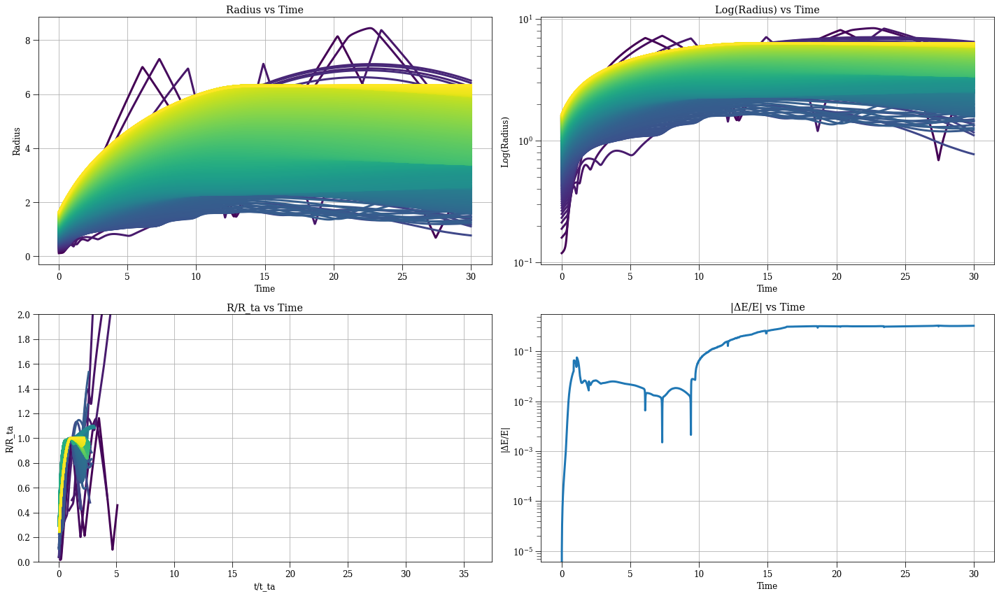

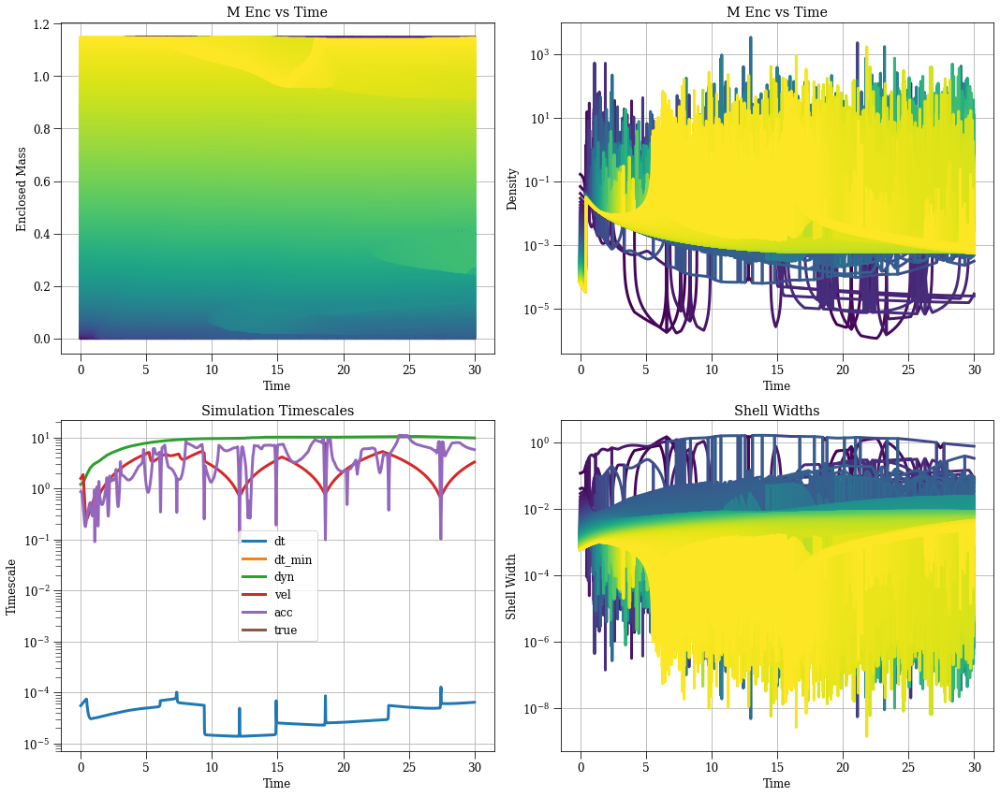

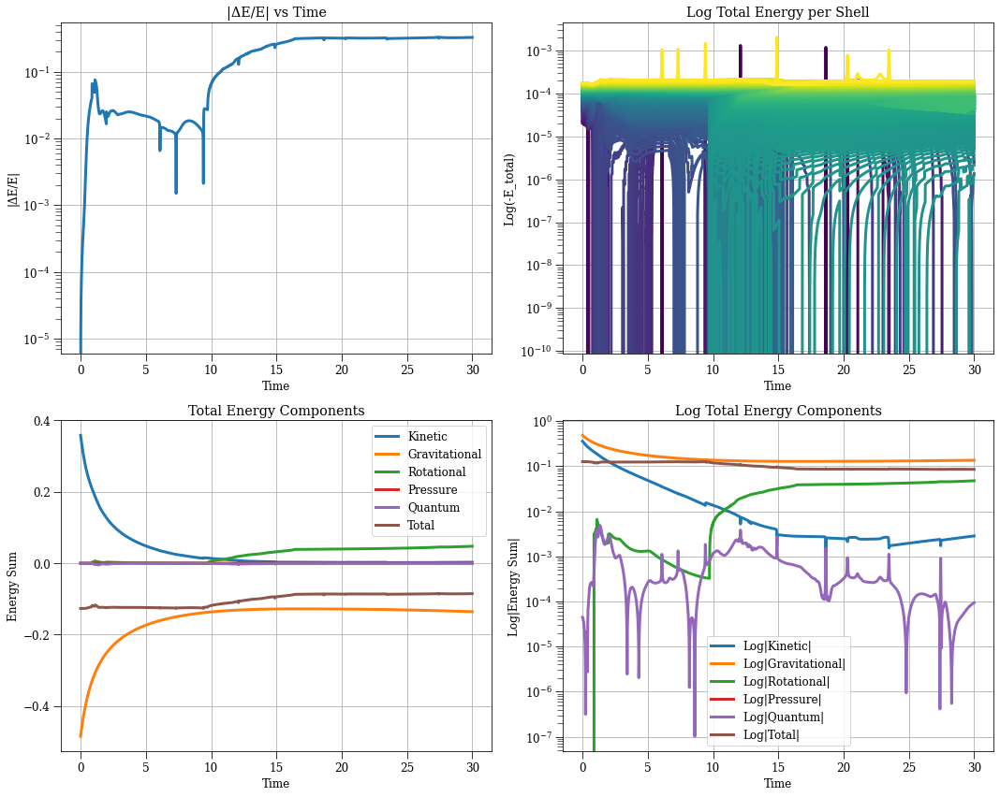

In [55]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-16-3.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

In [56]:
r_max = 1.65
j_coef = 9e-1
N = 1000
t_max = 30
safety_factor = 1e-3
save_dt = 1e-2
delta = 0.15
irs = 'equal_mass'#'r0min_start_equal'
ivs = 'peculiar'
density_strategy = 'background_plus_power_law_total'
accel_strategy, ang_mom_strategy = 'grant_gmr_j_at_r_ta_fdm3', 'gmr' #grant_gmr_j_at_r_ta_soft'
energy_strategy = 'kin_grav_rot_fdm_absorbed'
softlen = 0
hbar2_over_m2 = (6e-2)**2
problematic_shell_strategy = 'nothing'

tss = 'dyn_vel_acc_dbvel_phase'
mes = 'inclusive'
save_strategy = 'default'
r_min = 0
gamma = -1
thickness_coef = 0

In [ ]:
config = make_config(N=N, r_min=r_min, r_max=r_max, t_max=t_max, j_coef=j_coef, save_dt=save_dt, density_strategy=density_strategy, delta=delta, safety_factor=safety_factor, stepper_strategy='leapfrog_hut',  timescale_strategy=tss, H=H0, initial_radius_strategy=irs, gamma=gamma, initial_v_strategy=ivs, accel_strategy=accel_strategy, ang_mom_strategy=ang_mom_strategy, save_filename=f'10-16-4.h5', r_small=1, softlen=softlen, problematic_shell_strategy=problematic_shell_strategy, thickness_coef=thickness_coef, m_enc_strategy=mes, save_strategy=save_strategy, hbar2_over_m2=hbar2_over_m2, energy_strategy=energy_strategy)
sc, results, plotter = run_sc(config, profile=False, plot=True);

{'G': 1,
 'H': 0.6666666666666666,
 'N': 1000,
 'accel_strategy': 'grant_gmr_j_at_r_ta_fdm3',
 'ang_mom_strategy': 'gmr',
 'delta': 0.15,
 'density_strategy': 'background_plus_power_law_total',
 'deque_size': 0,
 'drhodr_strategy': 'finite_diff',
 'dt': 1e-05,
 'dt_min': 0,
 'energy_strategy': 'kin_grav_rot_fdm_absorbed',
 'gamma': -1,
 'hbar2_over_m2': 0.0036,
 'initial_mass_strategy': 'integrated_mass',
 'initial_radius_strategy': 'equal_mass',
 'initial_v_strategy': 'peculiar',
 'j_coef': 0.9,
 'm_enc_strategy': 'inclusive',
 'm_pert': 1,
 'next_save_time': 0,
 'num_crossing': 0,
 'point_mass': 0,
 'point_mass_strategy': 'rmin_rho_r',
 'polytropic_coef': 0,
 'polytropic_index': -1,
 'pressure_strategy': 'zero',
 'problematic_shell_strategy': 'nothing',
 'r0_min': 0.00165,
 'r_max': 1.65,
 'r_min': 0,
 'r_min_strategy': 'nothing',
 'r_small': 1,
 'r_ta_strategy': 'r_ta_cycloid',
 'relaxation_time': 0,
 'rho_bar': 0.05305164769729845,
 'safety_factor': 0.001,
 'save_dt': 0.01,
 'save_

2025-10-17 04:40:45,969 - collapse - INFO - Simulation setup complete


Text(0, 0.5, 'rho_r (Msun/kpc^3)')

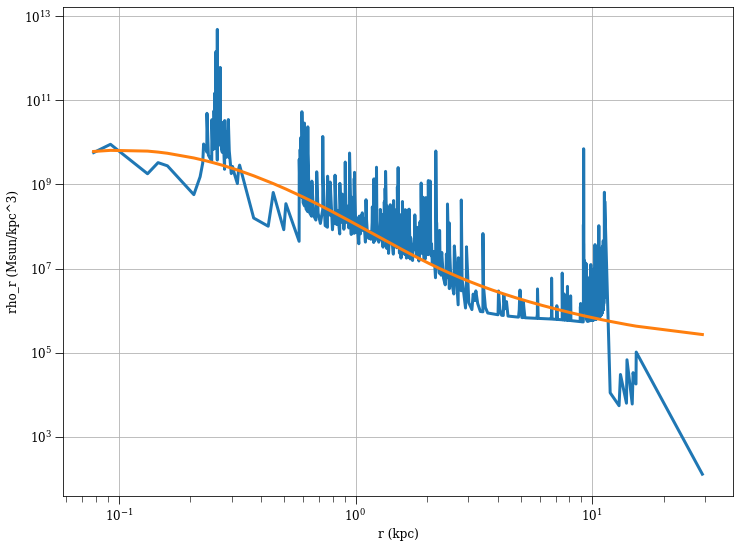

In [11]:
params, results = load_simulation_data('10-23-9.h5')
rvals = results['r'][-1,:]
menc = results['m_enc'][-1,:]
rho_r = results['rho_r'][-1,:]
sorted_indices = np.argsort(rvals)
rvals = rvals[sorted_indices]
menc = menc[sorted_indices]
rho_r = rho_r[sorted_indices]
loglog_menc_spline = UnivariateSpline(np.log(rvals), np.log(menc), k=5, s=None)
b0 = loglog_menc_spline(np.log(rvals))
b1 = loglog_menc_spline.derivative(1)(np.log(rvals))
y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)

plt.plot(rvals*2.35, rho_r / (2.35**3) * 1e10)
plt.plot(rvals*2.35, np.exp(y) / (2.35**3) * 1e10)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('r (kpc)')
plt.ylabel('rho_r (Msun/kpc^3)')

Text(0, 0.5, 'rho_r (Msun/kpc^3)')

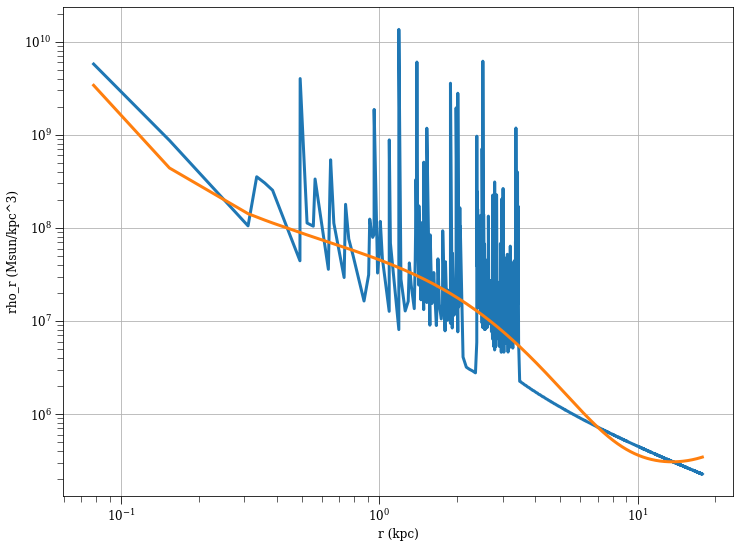

In [22]:
params, results = load_simulation_data('10-23-10.h5')
rvals = results['r'][-1,:]
menc = results['m_enc'][-1,:]
rho_r = results['rho_r'][-1,:]
sorted_indices = np.argsort(rvals)
rvals = rvals[sorted_indices]
menc = menc[sorted_indices]
rho_r = rho_r[sorted_indices]
loglog_menc_spline = UnivariateSpline(np.log(rvals), np.log(menc), k=5, s=None)
b0 = loglog_menc_spline(np.log(rvals))
b1 = loglog_menc_spline.derivative(1)(np.log(rvals))
y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)

plt.plot(rvals*2.35, rho_r / (2.35**3) * 1e10)
plt.plot(rvals*2.35, np.exp(y) / (2.35**3) * 1e10)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('r (kpc)')
plt.ylabel('rho_r (Msun/kpc^3)')

Text(0, 0.5, 'rho_r (Msun/kpc^3)')

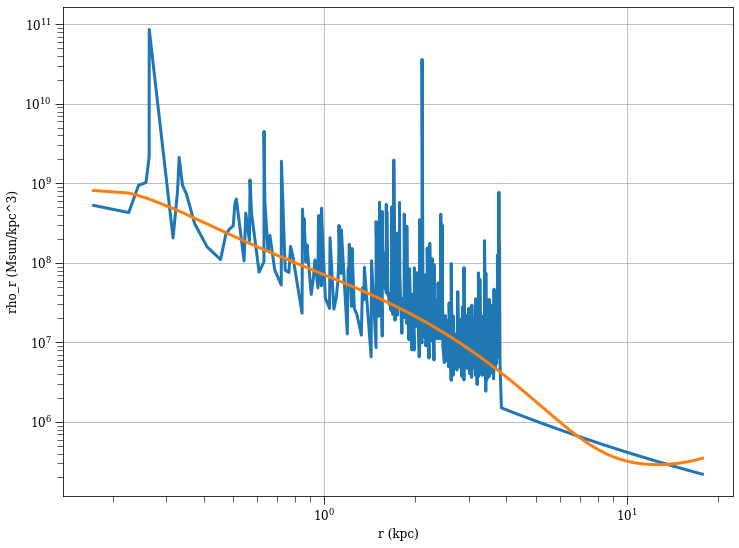

In [28]:
params, results = load_simulation_data('10-23-10.h5')
rvals = results['r'][-1,:]
menc = results['m_enc'][-1,:]
rho_r = results['rho_r'][-1,:]
sorted_indices = np.argsort(rvals)
rvals = rvals[sorted_indices]
menc = menc[sorted_indices]
rho_r = rho_r[sorted_indices]
loglog_menc_spline = UnivariateSpline(np.log(rvals), np.log(menc), k=5, s=None)
b0 = loglog_menc_spline(np.log(rvals))
b1 = loglog_menc_spline.derivative(1)(np.log(rvals))
y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)

plt.plot(rvals*2.35, rho_r / (2.35**3) * 1e10)
plt.plot(rvals*2.35, np.exp(y) / (2.35**3) * 1e10)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('r (kpc)')
plt.ylabel('rho_r (Msun/kpc^3)')

In [ ]:
params, results = load_simulation_data('10-9-1.h5')
rvals = results['r'][-1,:]
menc = results['m_enc'][-1,:]
sorted_indices = np.argsort(rvals)
rvals = rvals[sorted_indices]
menc = menc[sorted_indices]

degree = 5
s = 1
hbar2_over_m2 = (1e-3)**2
from scipy.interpolate import UnivariateSpline

loglog_menc_spline = UnivariateSpline(np.log(rvals), np.log(menc), k=degree, s=s)
b0 = loglog_menc_spline(np.log(rvals))
b1 = loglog_menc_spline.derivative(1)(np.log(rvals))
b2 = loglog_menc_spline.derivative(2)(np.log(rvals))
b3 = loglog_menc_spline.derivative(3)(np.log(rvals))
b4 = loglog_menc_spline.derivative(4)(np.log(rvals))
y = b0 - 3*np.log(rvals) - np.log(4*np.pi) + np.log(b1)
u1 = b1 + b2/b1 - 3
u2 = b2 + b3/b1 - (b2/b1)**2
u3 = b3 + b4/b1 - 3*b2*b3/b1**2 + 2*(b2/b1)**3

d1 = u1/rvals
d2 = (u2-u1)/rvals**2
d3 = (u3-3*u2+2*u1)/rvals**3

aq = hbar2_over_m2 * (1/4 * d3 + 1/4 * d1*d2 - 1/2 * 1/rvals**2 * d1 + 1/2 * 1/rvals * d2)
plt.plot(rvals, menc, marker='o')
plt.plot(rvals, np.exp(loglog_menc_spline(np.log(rvals))), marker='x')
logmenc_spline = UnivariateSpline(rvals, np.log(menc), k=degree, s=s)
plt.plot(rvals, np.exp(logmenc_spline(rvals)), marker='.')
menc_spline = UnivariateSpline(rvals, menc, k=degree, s=s)
plt.plot(rvals, menc_spline(rvals), marker='+')
plt.yscale('log')
plt.xscale('log')
plt.figure()
s = 1
loglog_menc_spline = UnivariateSpline(np.log(rvals), np.log(menc), k=degree, s=s)
plt.plot(rvals, menc, marker='o')
plt.plot(rvals, np.exp(loglog_menc_spline(np.log(rvals))), marker='x')
logmenc_spline = UnivariateSpline(rvals, np.log(menc), k=degree, s=s)
#plt.plot(rvals, np.exp(logmenc_spline(rvals)), marker='.')
menc_spline = UnivariateSpline(rvals, menc, k=degree, s=s)
#plt.plot(rvals, menc_spline(rvals), marker='+')
plt.yscale('log')
plt.xscale('log')
plt.figure()
plt.loglog(rvals, np.abs(aq))
plt.figure()
#plt.loglog(rvals, y)
plt.figure()
plt.loglog(rvals, np.abs(d1))
plt.figure()
plt.loglog(rvals, np.abs(d2))
plt.figure()
plt.loglog(rvals, np.abs(d3))